In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
import random
import math

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the folder path
folder_path = '/content/drive/My Drive/EXDATA'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# CONFIGURATION FLAGS
use_effective_gap = True
plot_effective_gap = True
manually_define_predictors = False
plot_fc = True

# Define base predictors for FCEast and FCWest
if manually_define_predictors:
    base_predictors_east = ['aextx', 'Vs2', 'VdEastWall', 'Kh', 'Damping', 'M', 'K', 'Gap']
    base_predictors_west = ['aextx', 'Vs2', 'VdWestWall', 'Kh', 'Damping', 'M', 'K', 'Gap']
else:
    base_predictors_east = ['aextx','s2', 'dWestWall', 'dEastWall', 'Vs2', 'VdEastWall','VdWestWall', 'Gap', 'Kh', 'Damping', 'M', 'K']
    base_predictors_west = ['aextx','s2', 'dWestWall', 'dEastWall', 'Vs2', 'VdEastWall','VdWestWall', 'Gap', 'Kh', 'Damping', 'M', 'K']

# Append extra predictors if selected
if use_effective_gap:
    base_predictors_east += ['EffectiveGapEast']
    base_predictors_west += ['EffectiveGapWest']

# Target columns
target_column_east = 'FCEast'
target_column_west = 'FCWest'
time_column = 'Time'


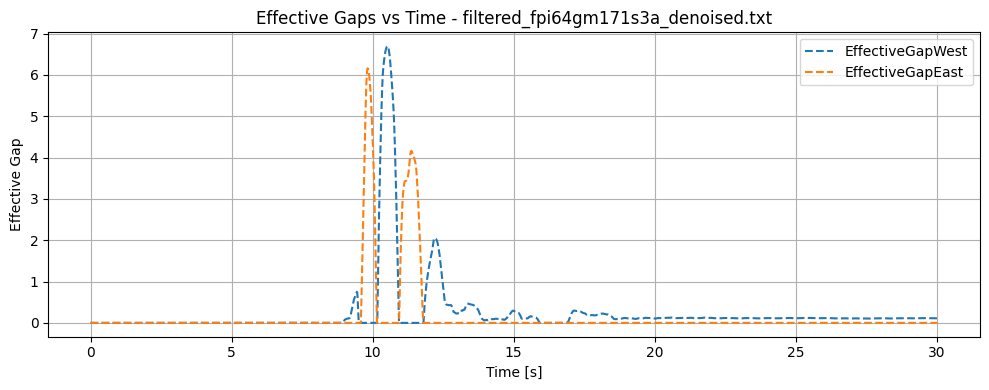

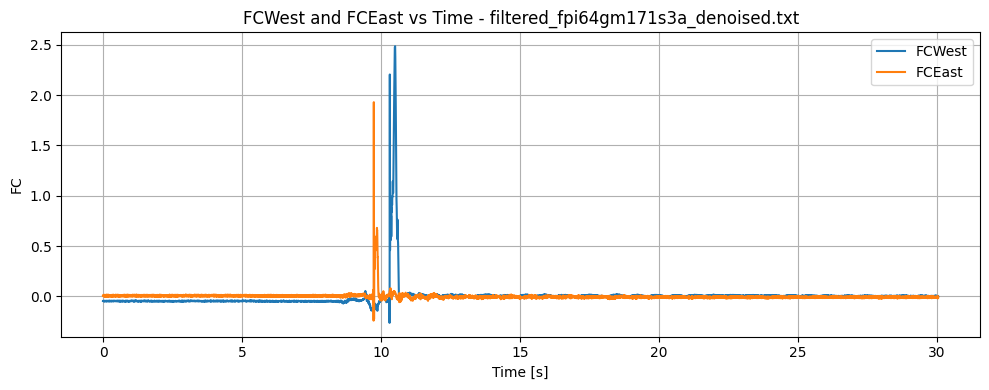

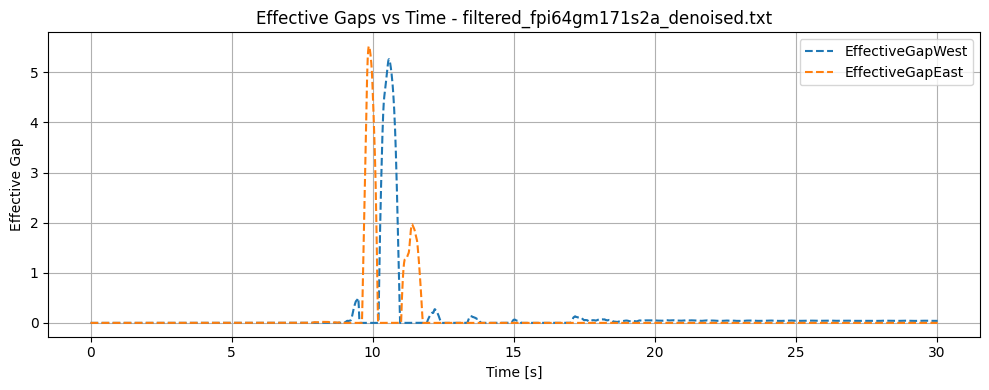

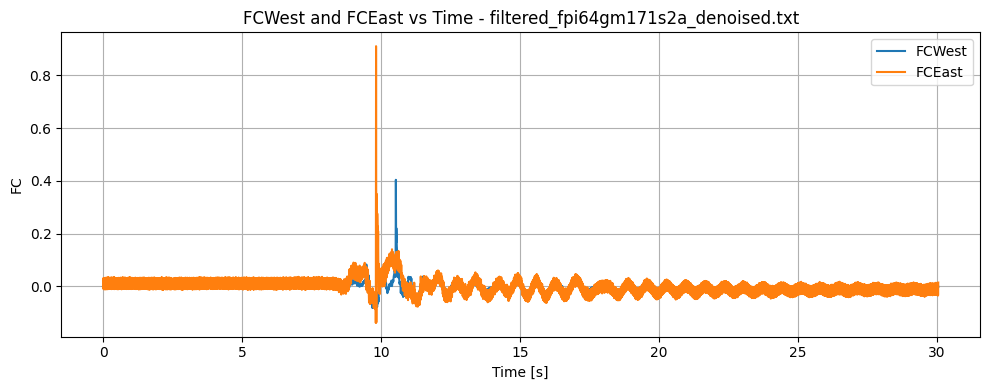

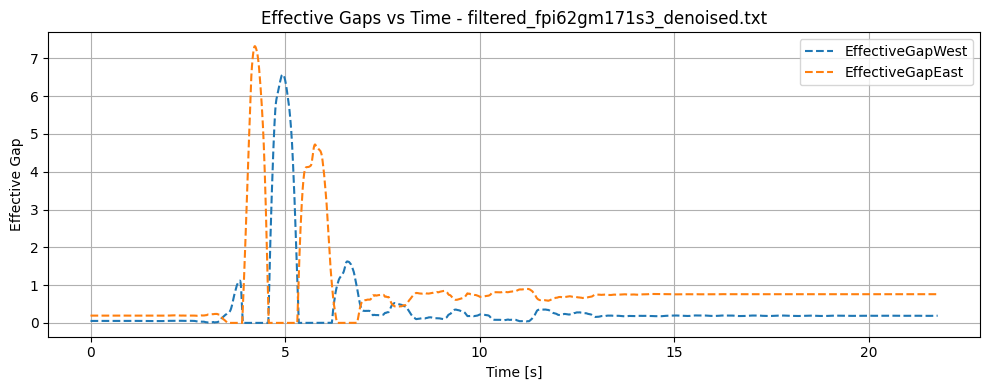

...

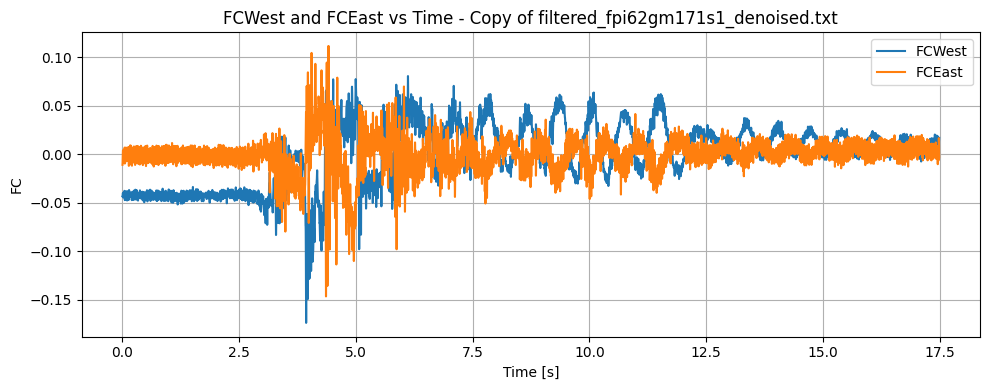

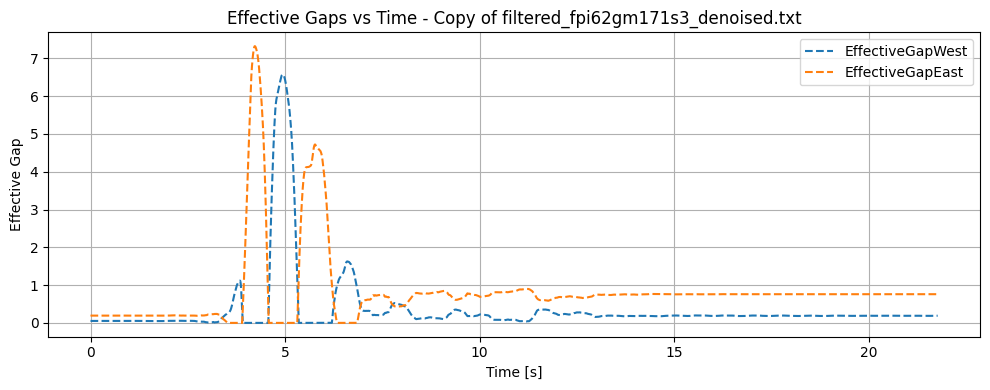

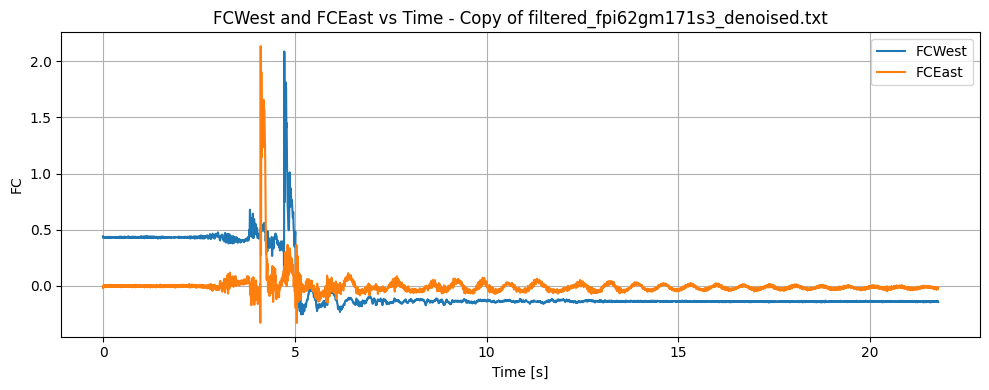

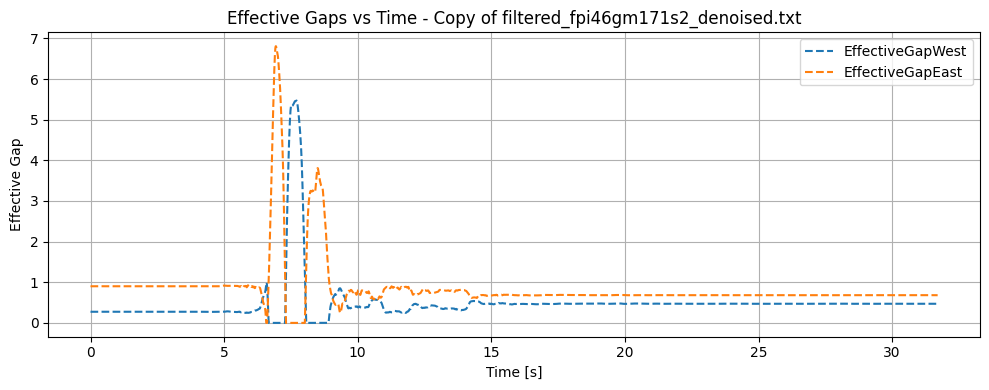

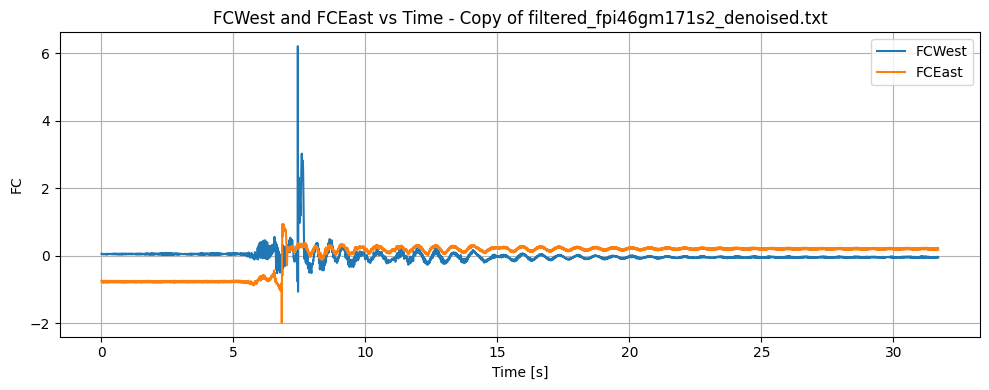


 Available Columns:
['ACCdEastWall', 'ACCdWestWall', 'ACCs2', 'ACCs3', 'ACCs4', 'ACCs5', 'Damping', 'FCEast', 'FCWest', 'Gap', 'K', 'Kh', 'M', 'Time', 'VdEastWall', 'VdWestWall', 'Vs2', 'Vs3', 'Vs4', 'Vs5', 'aextx', 'dEastWall', 'dWestWall', 's2', 's3', 's4', 's5']

 Predictor Columns Used (East):
['aextx', 's2', 'dWestWall', 'dEastWall', 'Vs2', 'VdEastWall', 'VdWestWall', 'Gap', 'Kh', 'Damping', 'M', 'K', 'EffectiveGapEast']

 Predictor Columns Used (West):
['aextx', 's2', 'dWestWall', 'dEastWall', 'Vs2', 'VdEastWall', 'VdWestWall', 'Gap', 'Kh', 'Damping', 'M', 'K', 'EffectiveGapWest']


In [5]:
# Read Files and Plot
all_data = []
combined_data = []
available_columns = set()

for file_name in os.listdir(folder_path):
    if file_name.endswith(".txt"):
        file_path = os.path.join(folder_path, file_name)
        try:
            df = pd.read_csv(file_path, sep=r'\s+', engine='python').dropna()
            available_columns.update(df.columns)

            # Compute Effective Gaps
            if use_effective_gap and {'Gap', 's2', 'dWestWall', 'dEastWall'}.issubset(df.columns):
                #df['EffectiveGapWest'] = df['Gap'] - abs(df['s2'] - df['dWestWall'])
                #df['EffectiveGapEast'] = df['Gap'] - abs(df['s2'] - df['dEastWall'])

                df['EffectiveGapWest'] = np.maximum(0 ,   df['s2'] - df['dWestWall'] )
                df['EffectiveGapEast'] = np.maximum(0 , -(df['s2'] - df['dEastWall']))


                if plot_effective_gap and time_column in df.columns:
                    plt.figure(figsize=(10, 4))
                    plt.plot(df[time_column], df['EffectiveGapWest'], label='EffectiveGapWest', linestyle='--')
                    plt.plot(df[time_column], df['EffectiveGapEast'], label='EffectiveGapEast', linestyle='--')
                    plt.title(f"Effective Gaps vs Time - {file_name}")
                    plt.xlabel("Time [s]")
                    plt.ylabel("Effective Gap")
                    plt.legend()
                    plt.grid(True)
                    plt.tight_layout()
                    plt.show()

            # Plot FCWest and FCEast vs Time
            if plot_fc and {target_column_east, target_column_west, time_column}.issubset(df.columns):
                plt.figure(figsize=(10, 4))
                plt.plot(df[time_column], df[target_column_west], label='FCWest', color='tab:blue')
                plt.plot(df[time_column], df[target_column_east], label='FCEast', color='tab:orange')
                plt.title(f"FCWest and FCEast vs Time - {file_name}")
                plt.xlabel("Time [s]")
                plt.ylabel("FC")
                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()

            # Save data
            all_data.append((df, file_name))
            combined_data.append(df)

        except Exception as e:
            print(f" Failed to read {file_name}: {e}")

# Summary
print("\n Available Columns:")
print(sorted(list(available_columns)))

print("\n Predictor Columns Used (East):")
print(base_predictors_east)

print("\n Predictor Columns Used (West):")
print(base_predictors_west)

In [9]:
full_df = pd.concat(combined_data, ignore_index=True)
full_df = full_df.sample(frac=1, random_state=42).reset_index(drop=True)  # shuffle rows

# FCEast
X_east = full_df[base_predictors_east]
y_east = full_df[target_column_east]
scaler_east = StandardScaler()
X_east_scaled = scaler_east.fit_transform(X_east)
X_train_east, X_test_east, y_train_east, y_test_east = train_test_split(
X_east_scaled, y_east, test_size=0.2, random_state=42)

# FCWest
X_west = full_df[base_predictors_west]
y_west = full_df[target_column_west]
scaler_west = StandardScaler()
X_west_scaled = scaler_west.fit_transform(X_west)
X_train_west, X_test_west, y_train_west, y_test_west = train_test_split(
X_west_scaled, y_west, test_size=0.2, random_state=42)

print(f"[ROW-WISE] X_train_east.shape = {X_train_east.shape}, y_train_east.shape = {y_train_east.shape}")
print(f"[ROW-WISE] X_train_west.shape = {X_train_west.shape}, y_train_west.shape = {y_train_west.shape}")

[ROW-WISE] X_train_east.shape = (1474905, 13), y_train_east.shape = (1474905,)
[ROW-WISE] X_train_west.shape = (1474905, 13), y_train_west.shape = (1474905,)


 Linear Regression (FCEast):
   MSE : 0.0783
   R²  : 0.0790



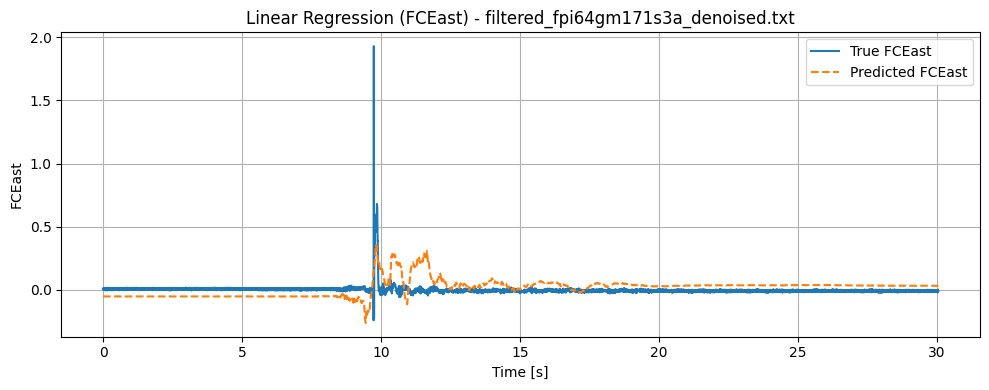

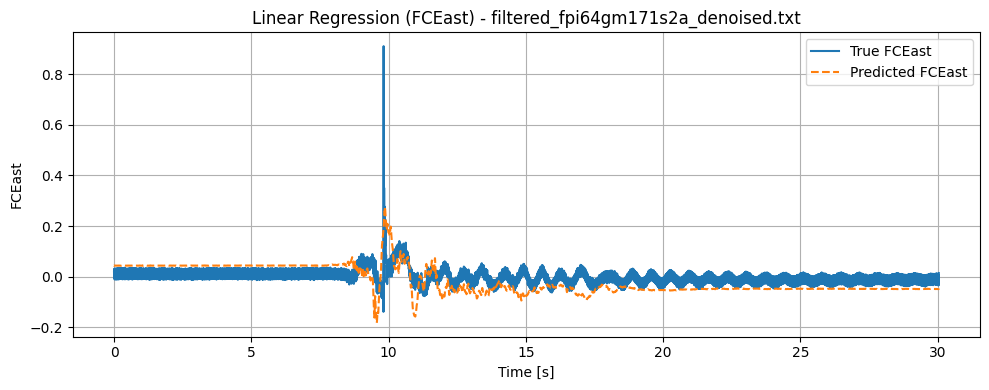

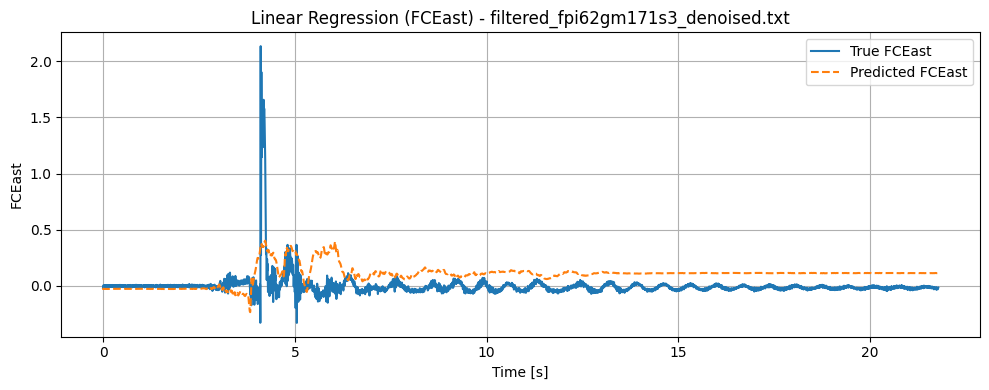

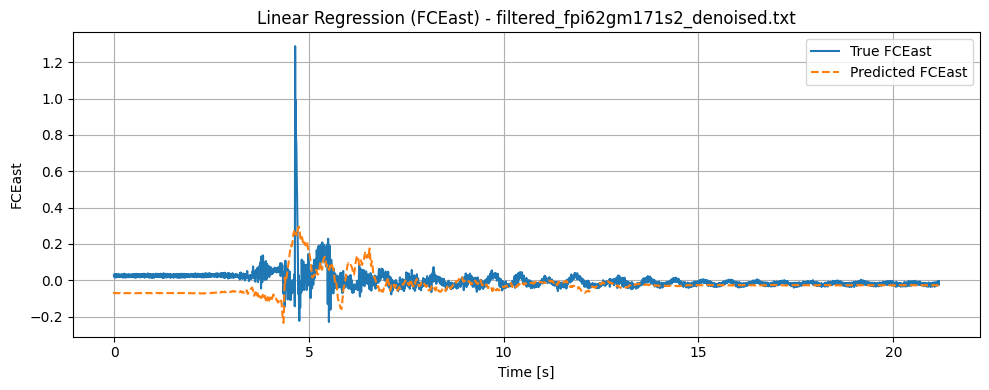

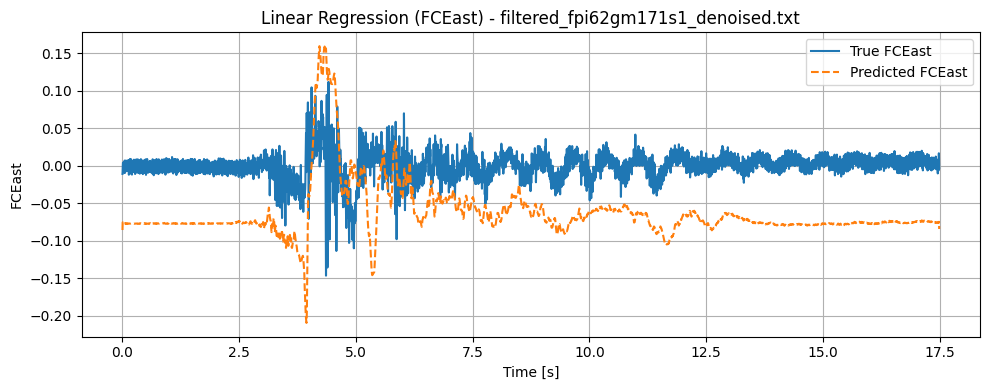

...

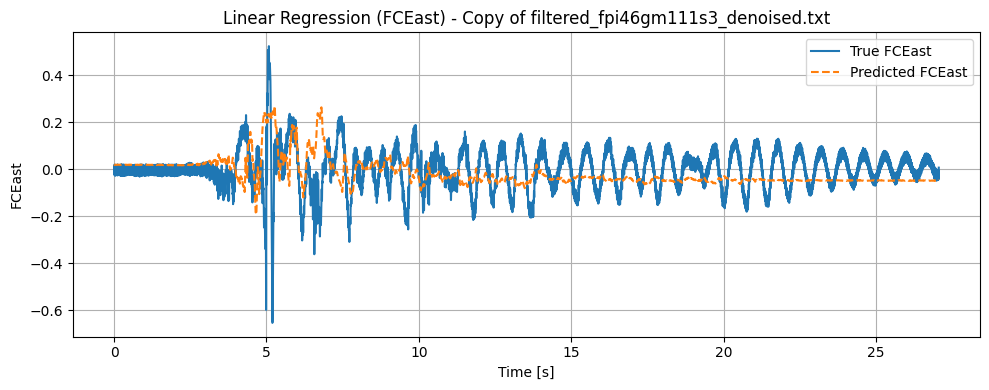

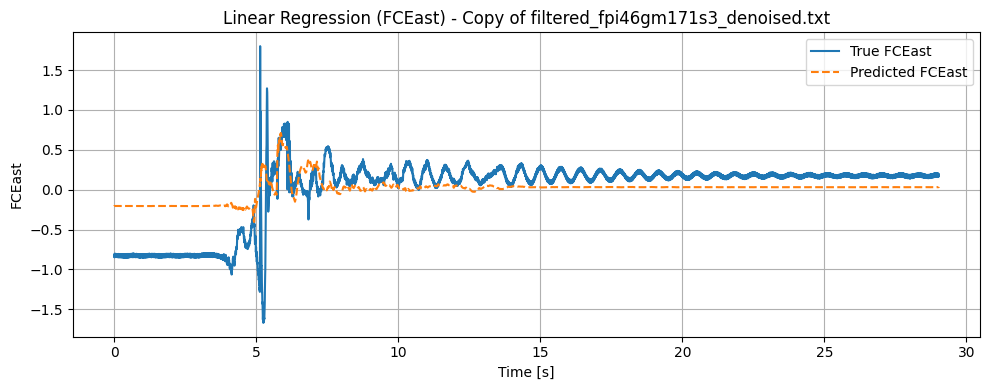

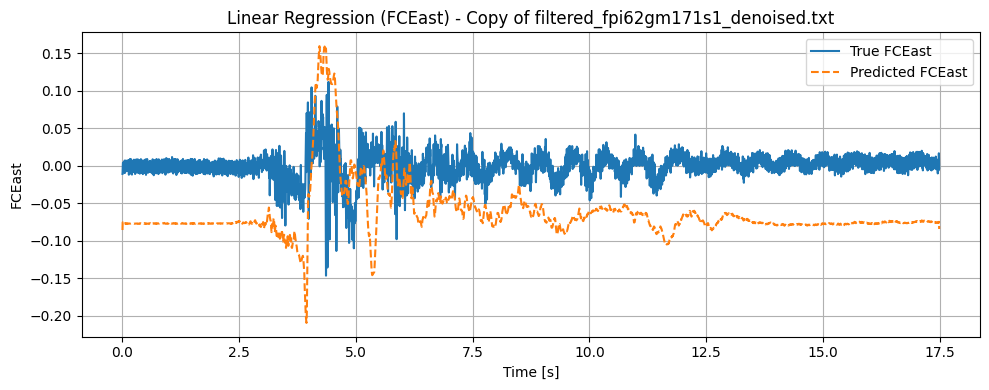

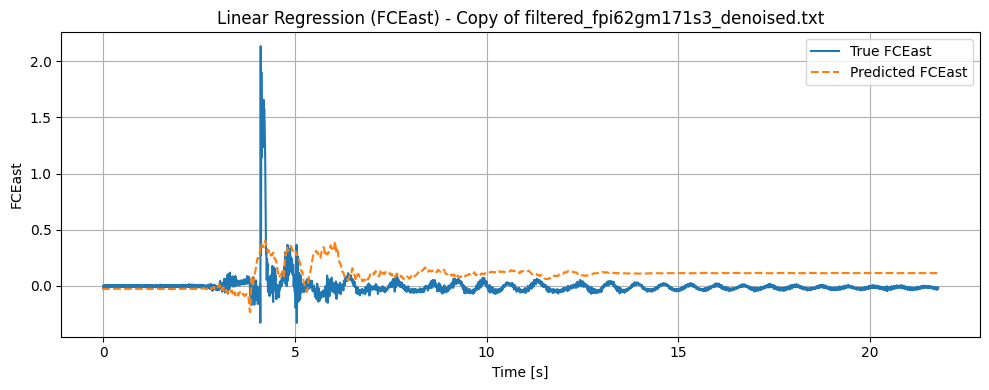

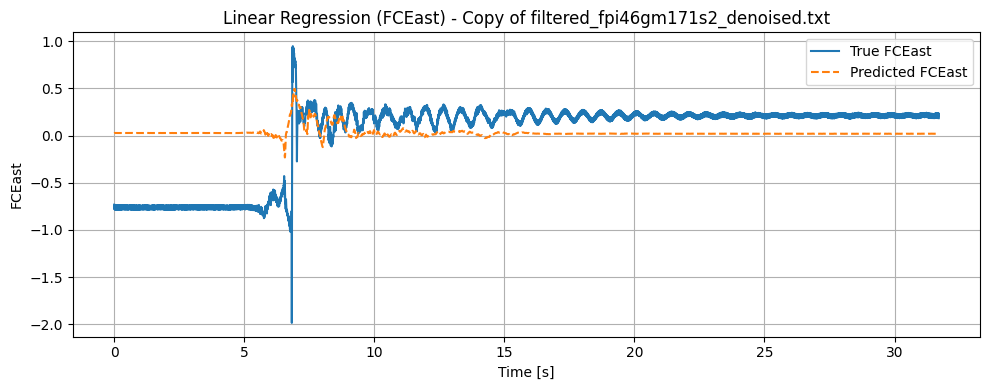

 Linear Regression (FCWest):
   MSE : 1.1869
   R²  : 0.2014



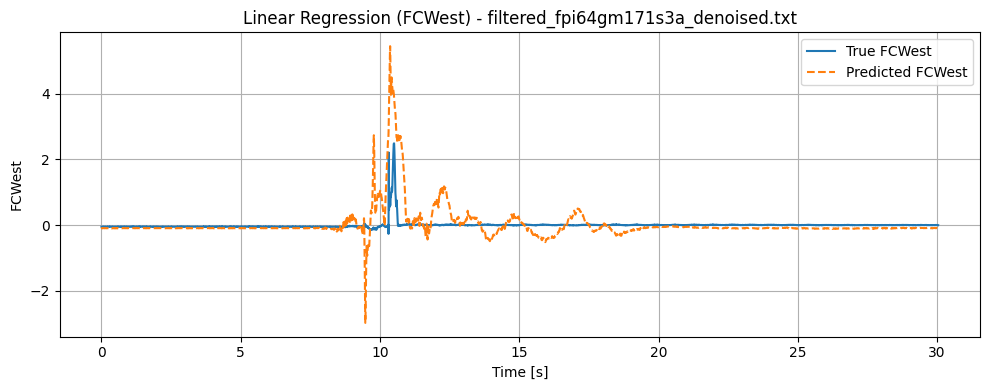

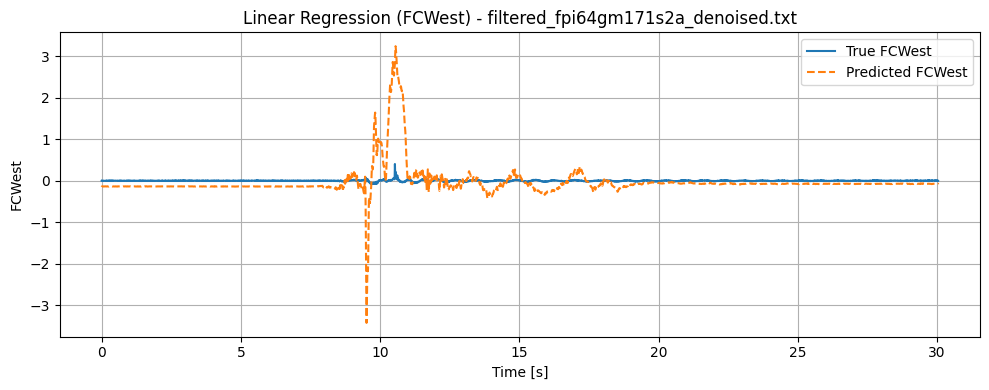

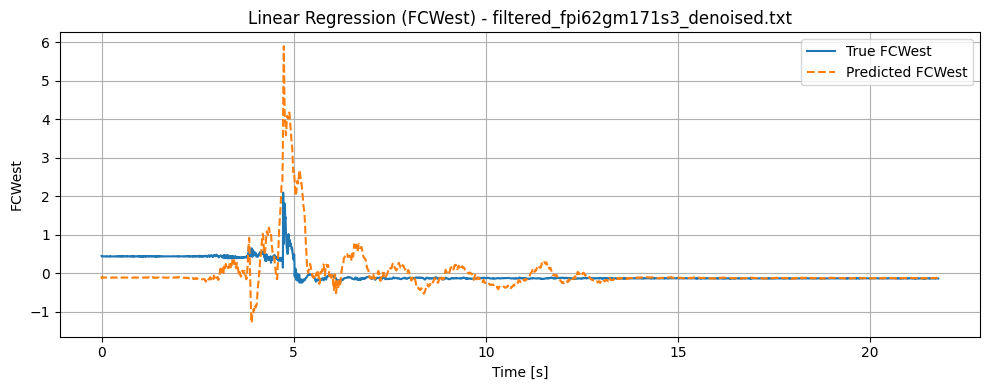

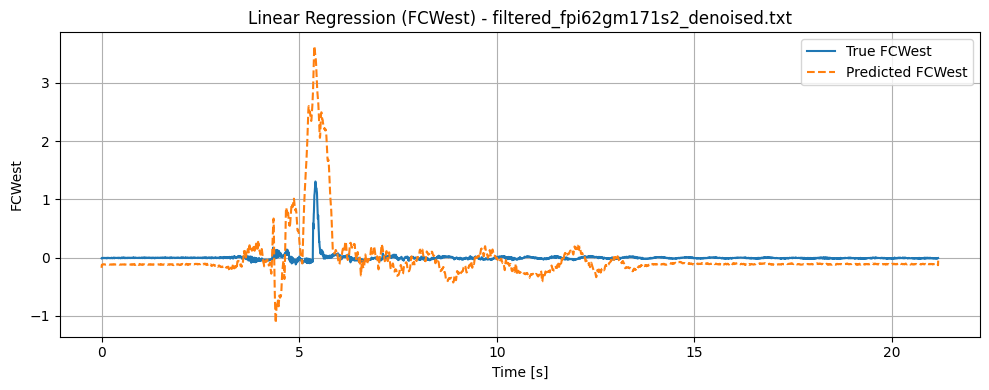

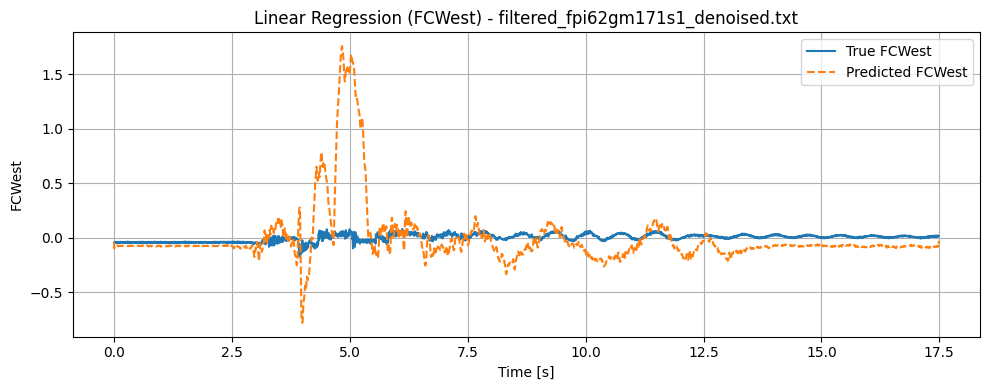

...

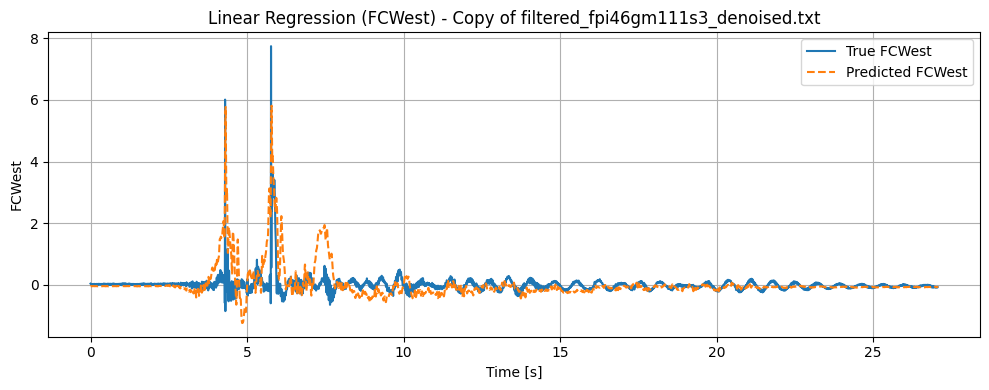

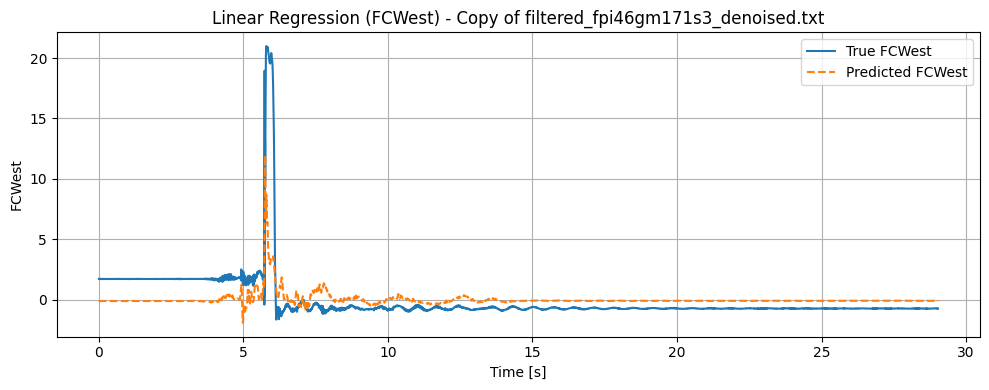

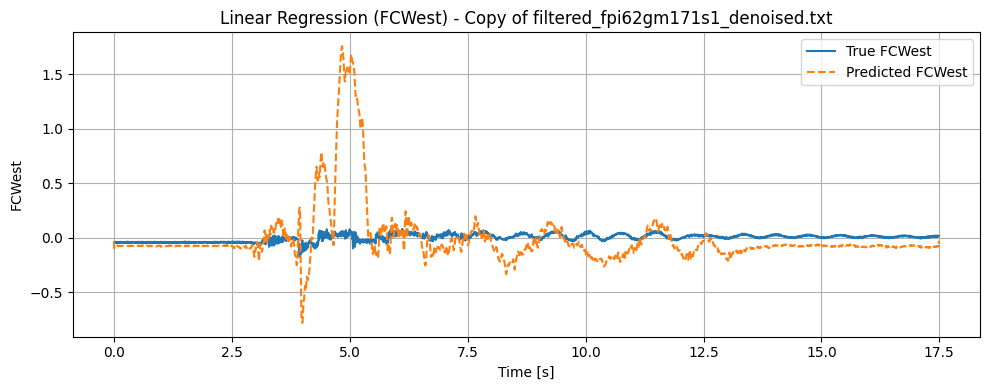

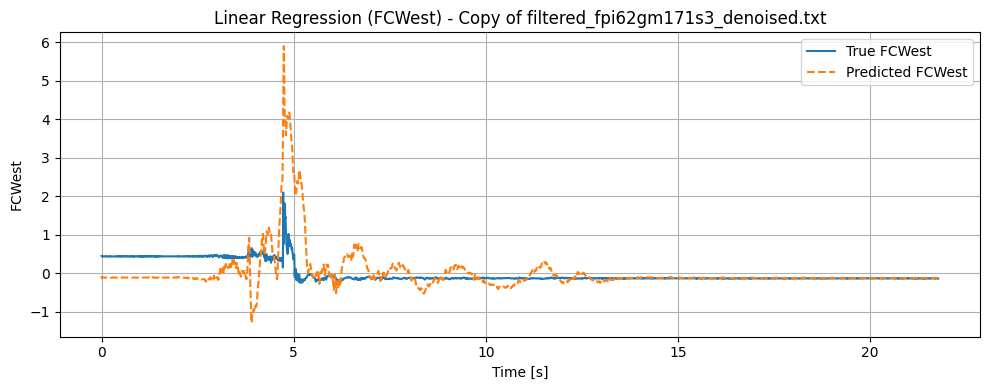

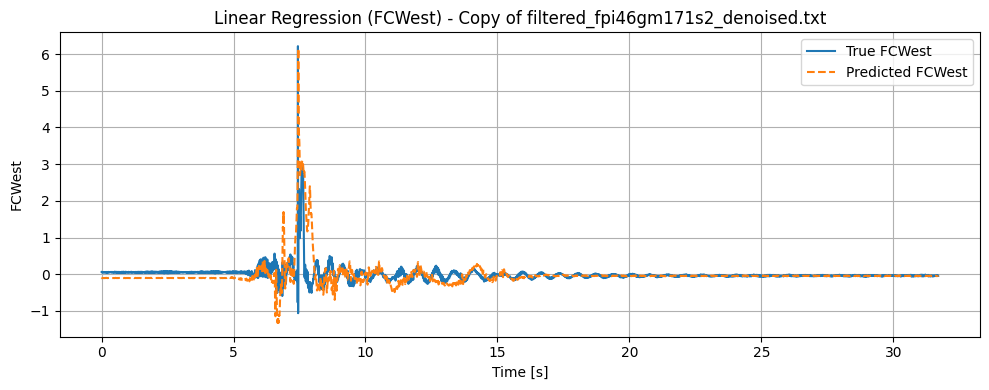

In [11]:
# 1. Linear Regression

# FCEast
lr_model_east = LinearRegression()
lr_model_east.fit(X_train_east, y_train_east)

y_test_pred_east = lr_model_east.predict(X_test_east)
print(" Linear Regression (FCEast):")
print(f"   MSE : {mean_squared_error(y_test_east, y_test_pred_east):.4f}")
print(f"   R²  : {r2_score(y_test_east, y_test_pred_east):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_east]
        y_true = df[target_column_east].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_east.transform(X_file)
        y_pred = lr_model_east.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCEast', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCEast', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Linear Regression (FCEast) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCEast")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCEast for {file_name}: {e}")

#  FCWest
lr_model_west = LinearRegression()
lr_model_west.fit(X_train_west, y_train_west)

y_test_pred_west = lr_model_west.predict(X_test_west)
print(" Linear Regression (FCWest):")
print(f"   MSE : {mean_squared_error(y_test_west, y_test_pred_west):.4f}")
print(f"   R²  : {r2_score(y_test_west, y_test_pred_west):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_west]
        y_true = df[target_column_west].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_west.transform(X_file)
        y_pred = lr_model_west.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCWest', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCWest', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Linear Regression (FCWest) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCWest")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCWest for {file_name}: {e}")


 Ridge Regression (FCEast):
   MSE : 0.0783
   R²  : 0.0790



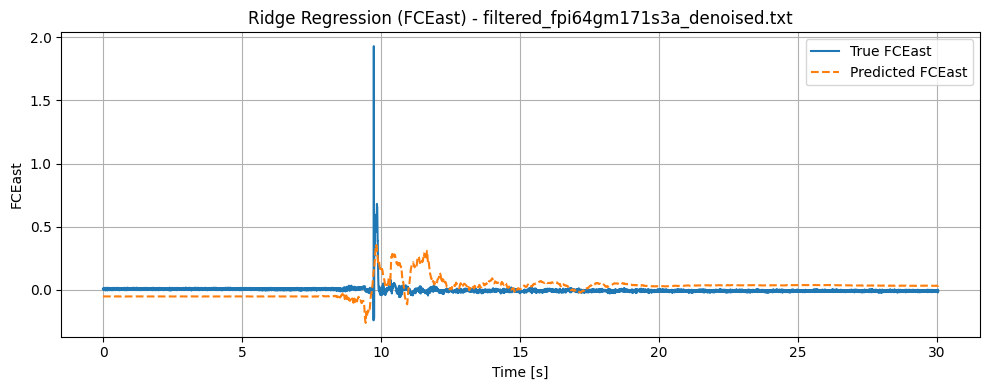

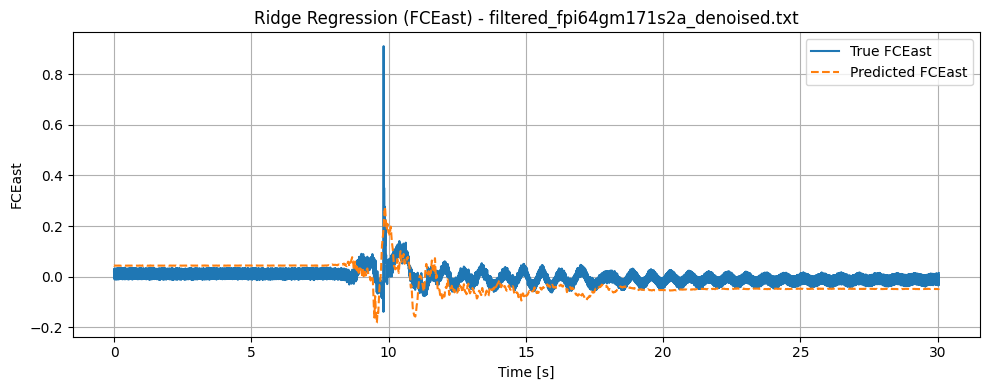

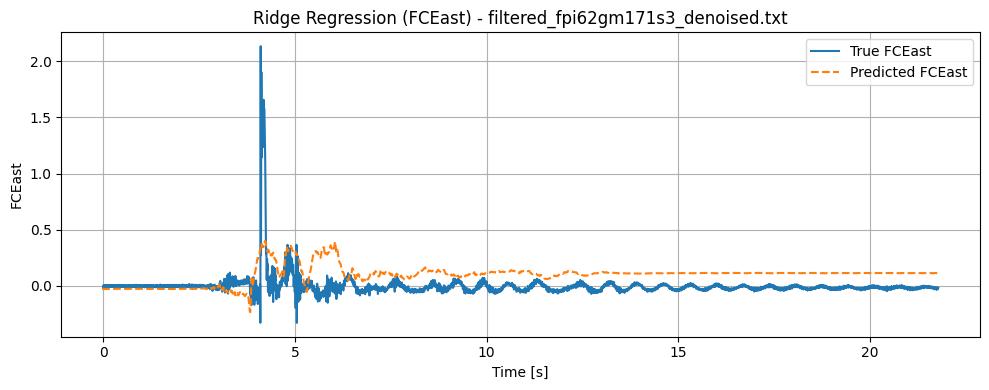

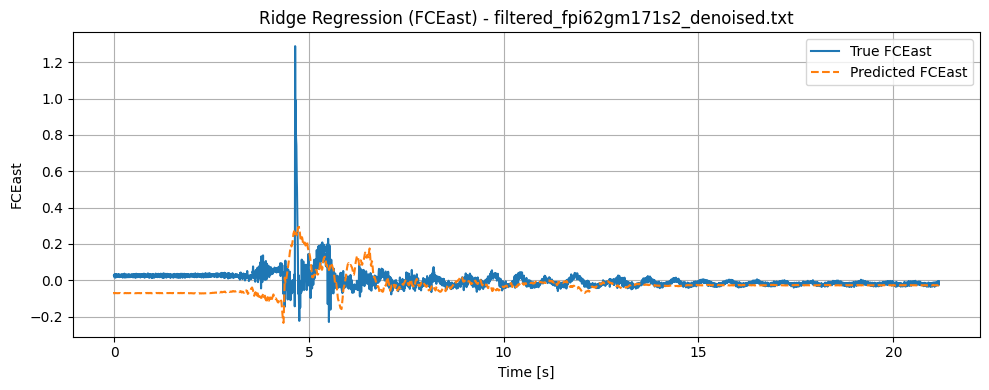

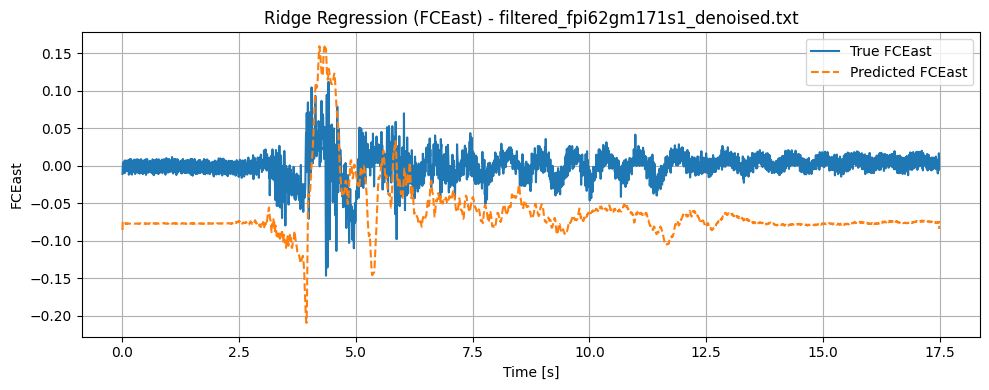

...

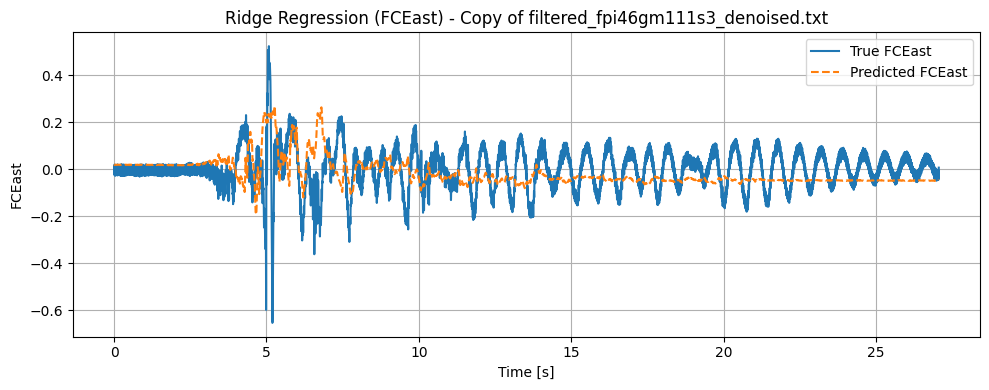

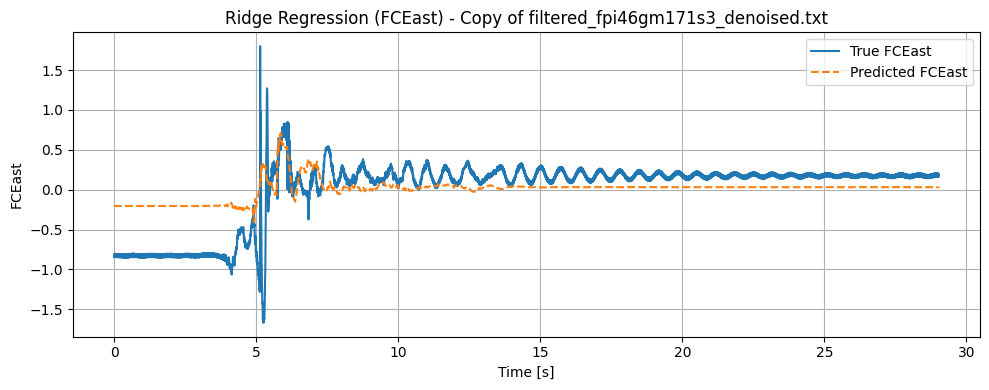

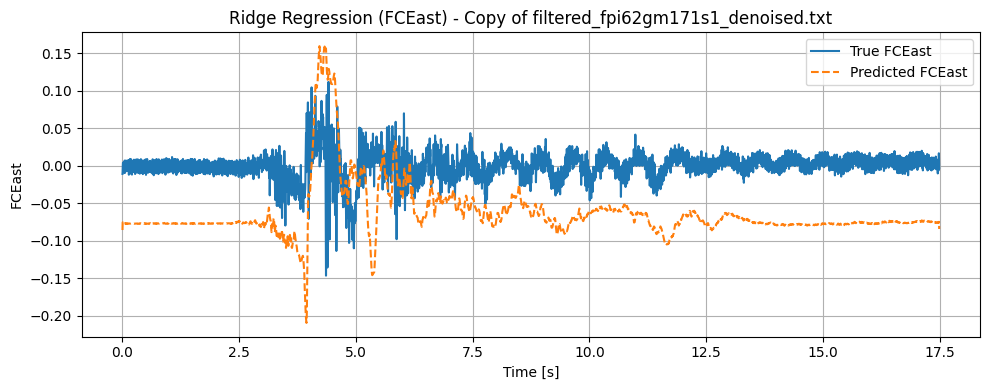

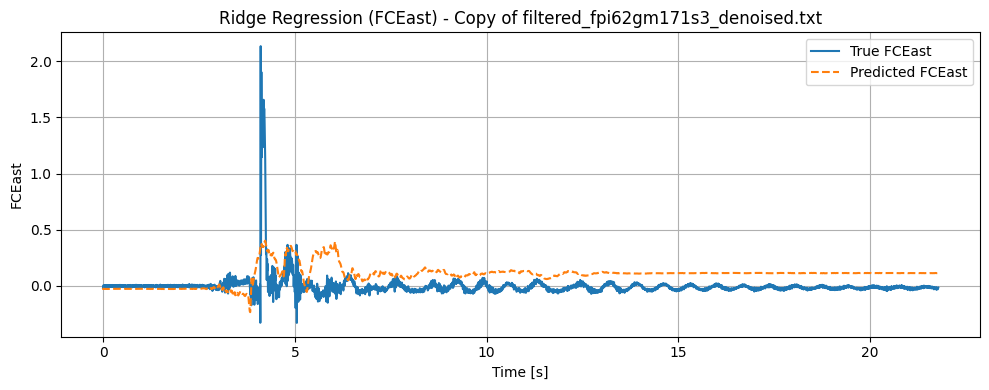

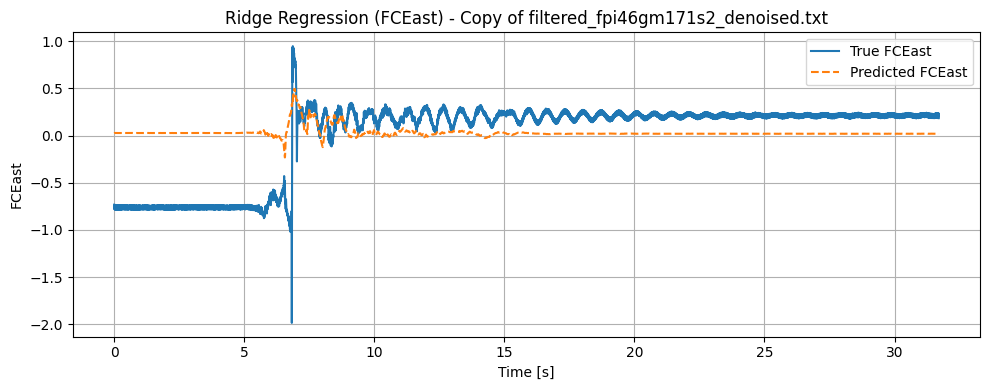

 Ridge Regression (FCWest):
   MSE : 1.1869
   R²  : 0.2014



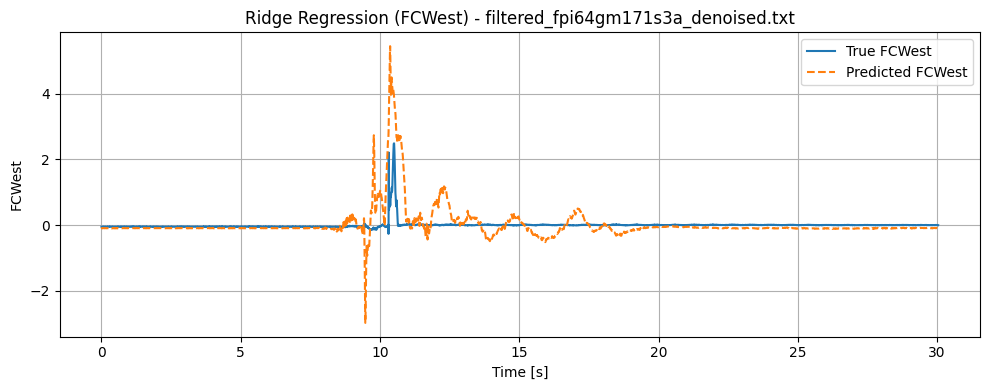

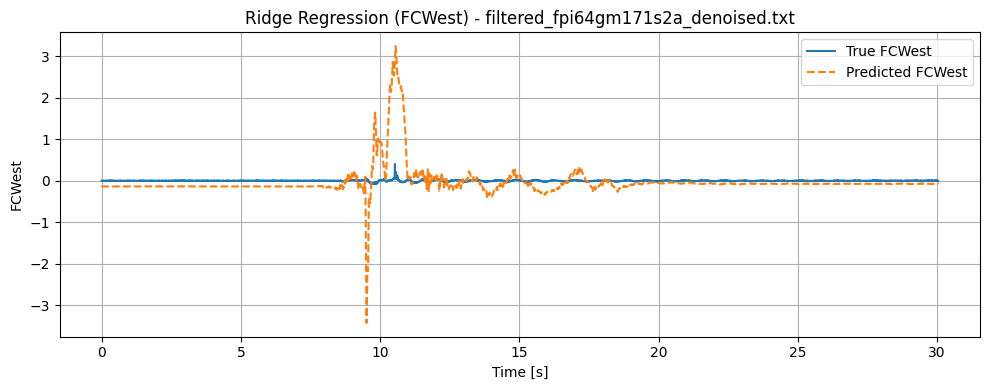

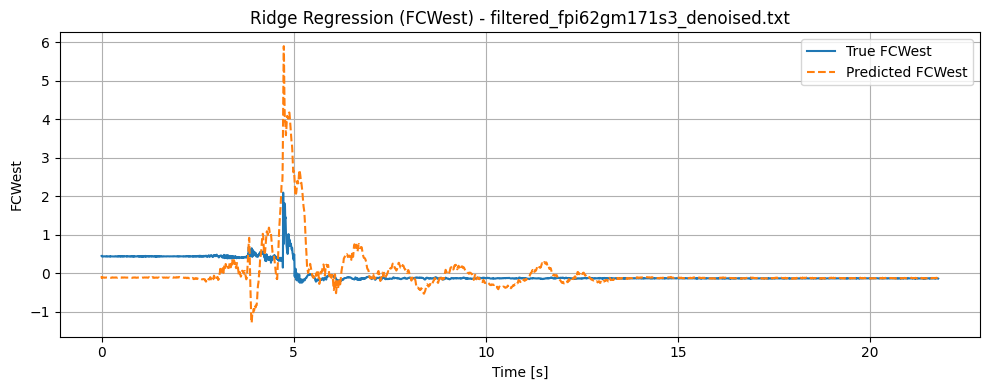

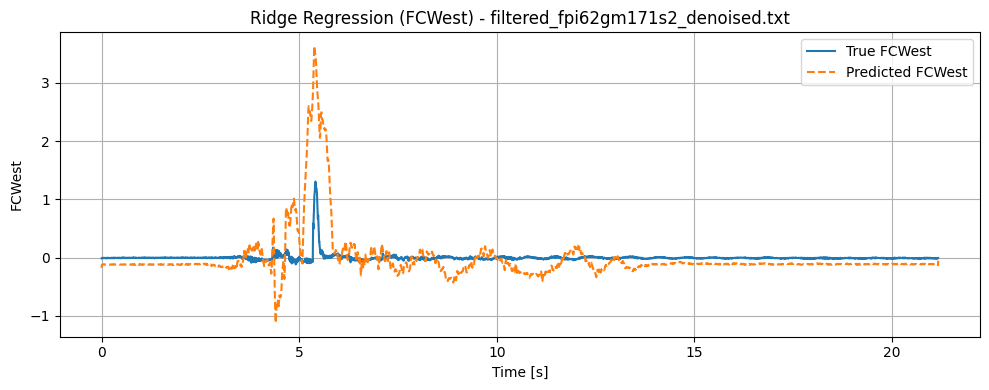

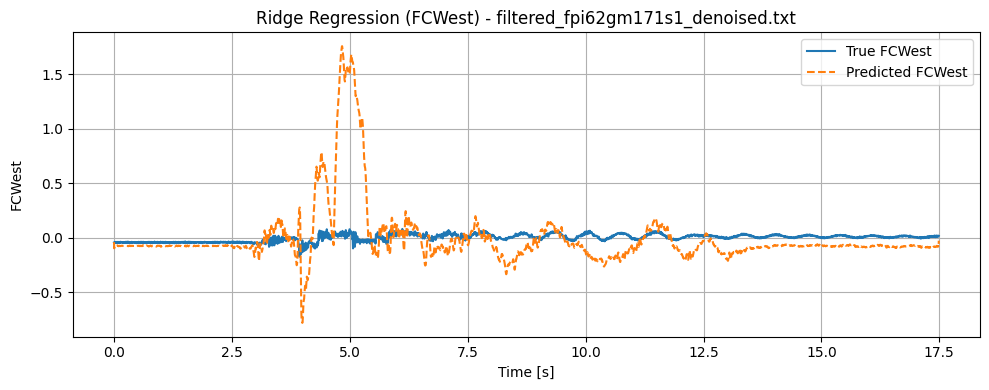

...

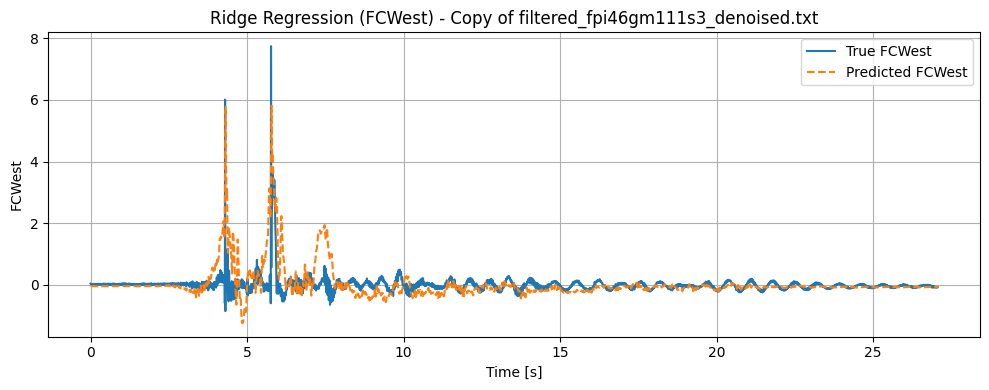

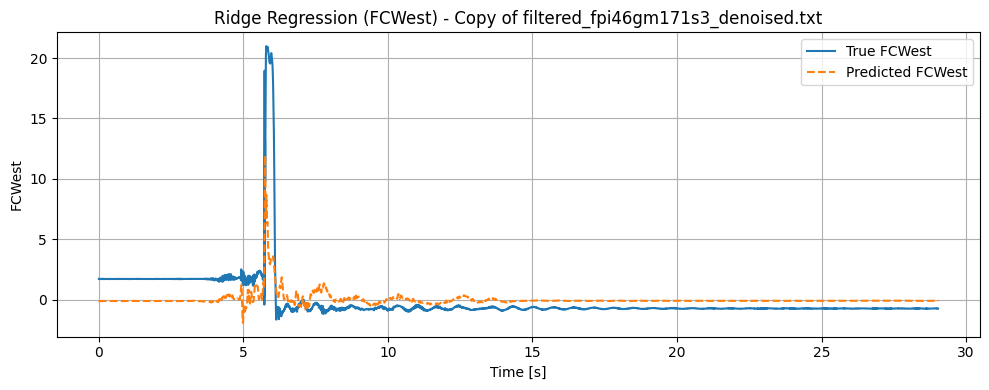

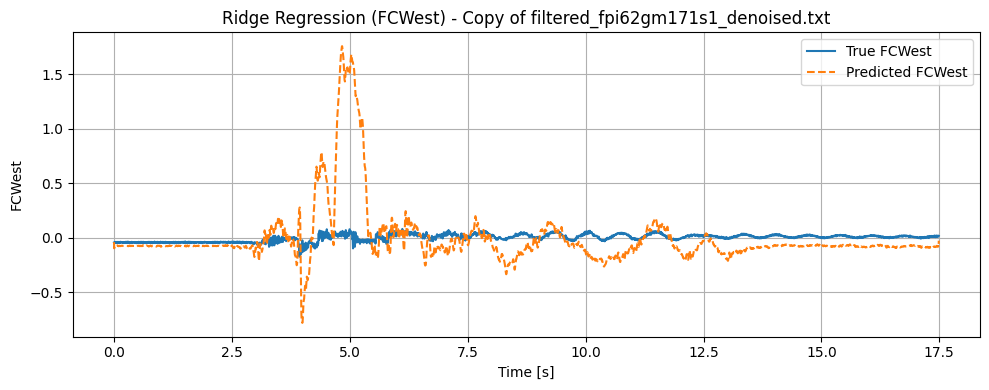

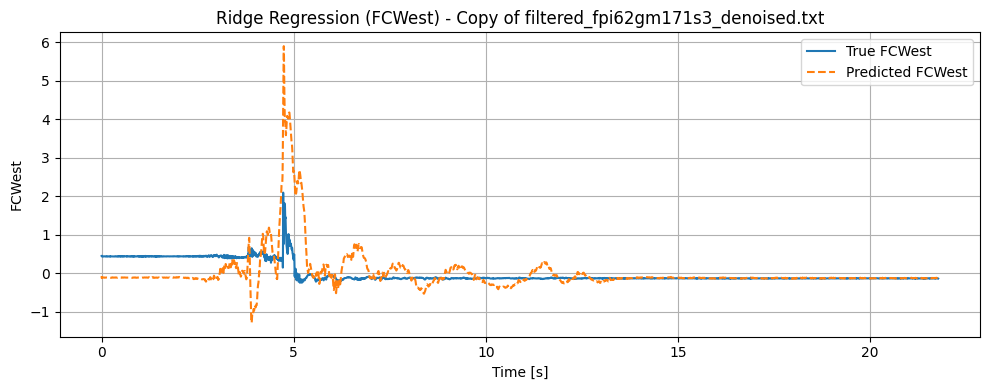

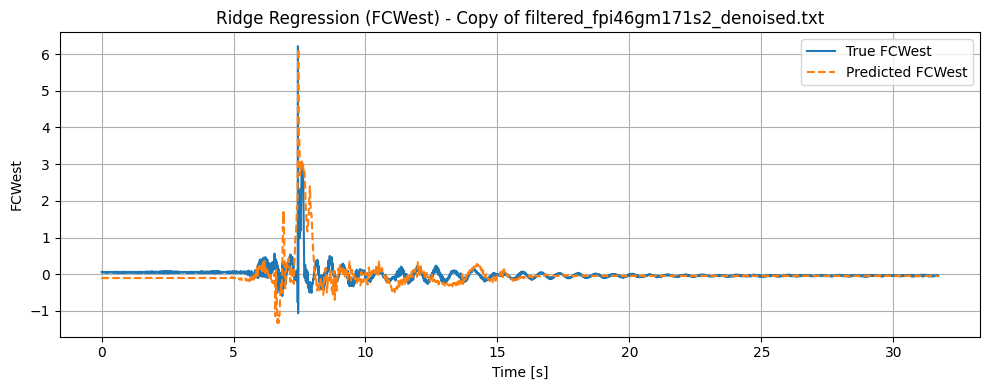

In [12]:
#  2. Ridge Regression

# FCEast
ridge_model_east = Ridge(alpha=1.0)
ridge_model_east.fit(X_train_east, y_train_east)

y_test_pred_east = ridge_model_east.predict(X_test_east)
print(" Ridge Regression (FCEast):")
print(f"   MSE : {mean_squared_error(y_test_east, y_test_pred_east):.4f}")
print(f"   R²  : {r2_score(y_test_east, y_test_pred_east):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_east]
        y_true = df[target_column_east].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_east.transform(X_file)
        y_pred = ridge_model_east.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCEast', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCEast', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Ridge Regression (FCEast) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCEast")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCEast for {file_name}: {e}")

# FCWest
ridge_model_west = Ridge(alpha=1.0)
ridge_model_west.fit(X_train_west, y_train_west)

y_test_pred_west = ridge_model_west.predict(X_test_west)
print(" Ridge Regression (FCWest):")
print(f"   MSE : {mean_squared_error(y_test_west, y_test_pred_west):.4f}")
print(f"   R²  : {r2_score(y_test_west, y_test_pred_west):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_west]
        y_true = df[target_column_west].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_west.transform(X_file)
        y_pred = ridge_model_west.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCWest', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCWest', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Ridge Regression (FCWest) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCWest")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCWest for {file_name}: {e}")


 Lasso Regression (FCEast):
   MSE : 0.0824
   R²  : 0.0314



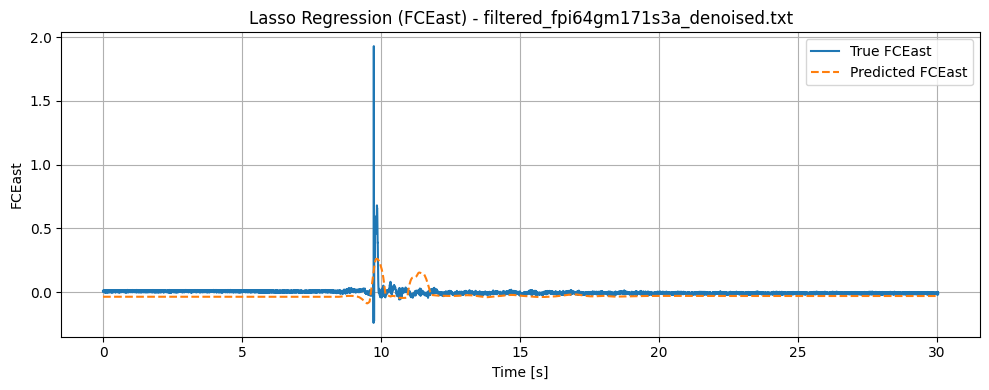

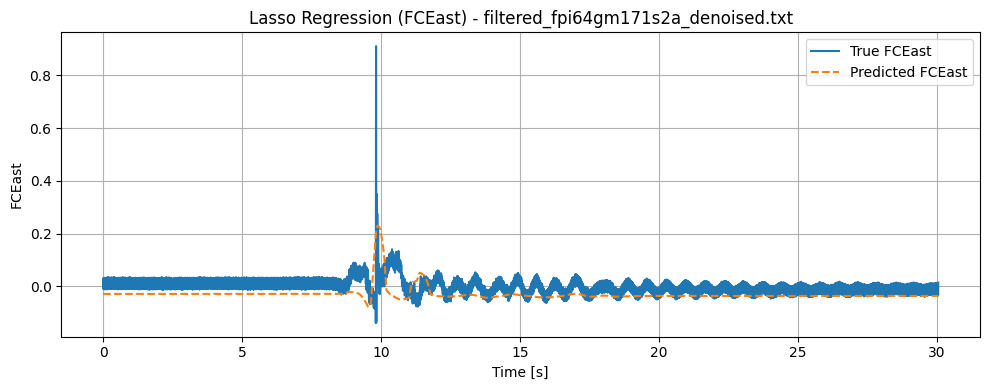

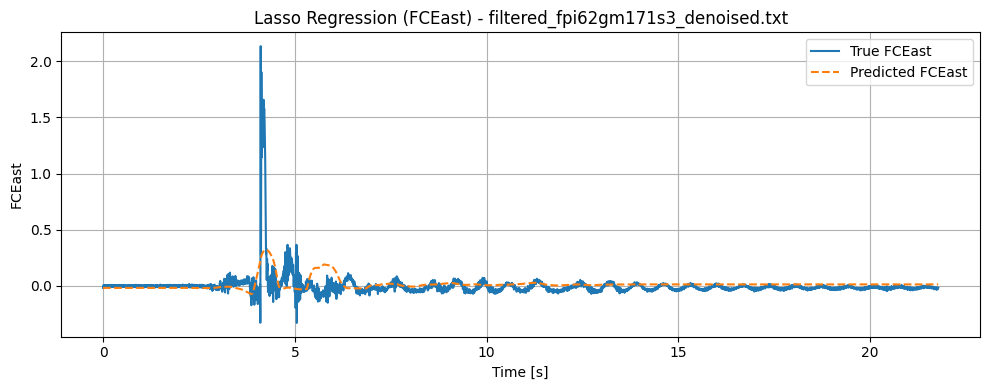

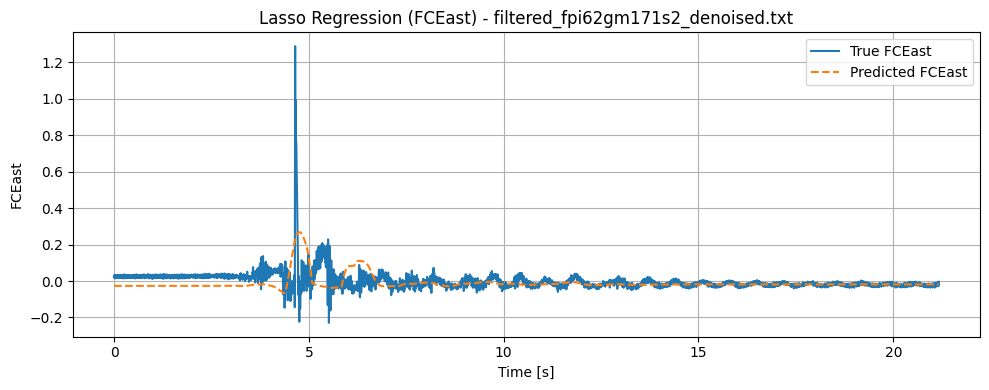

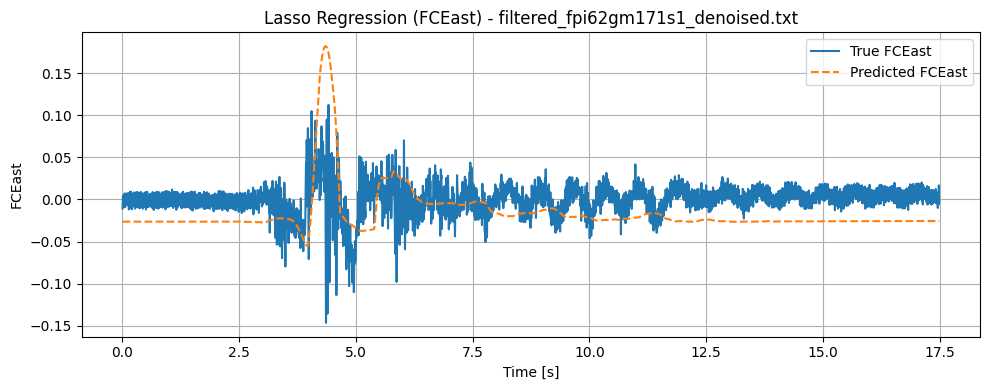

...

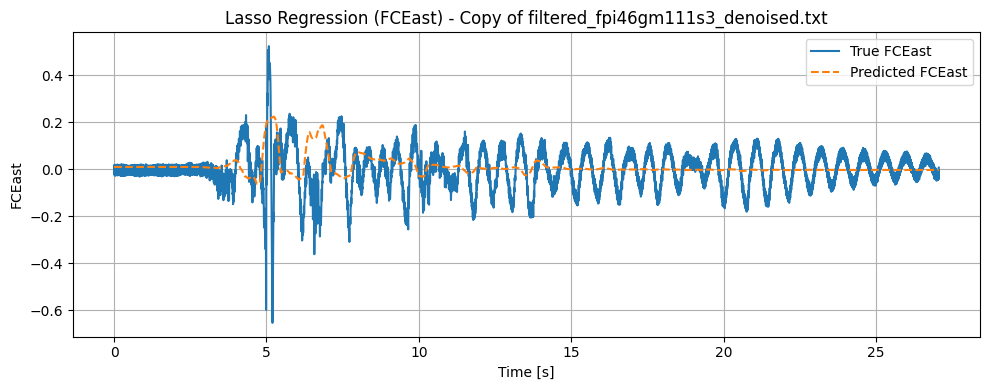

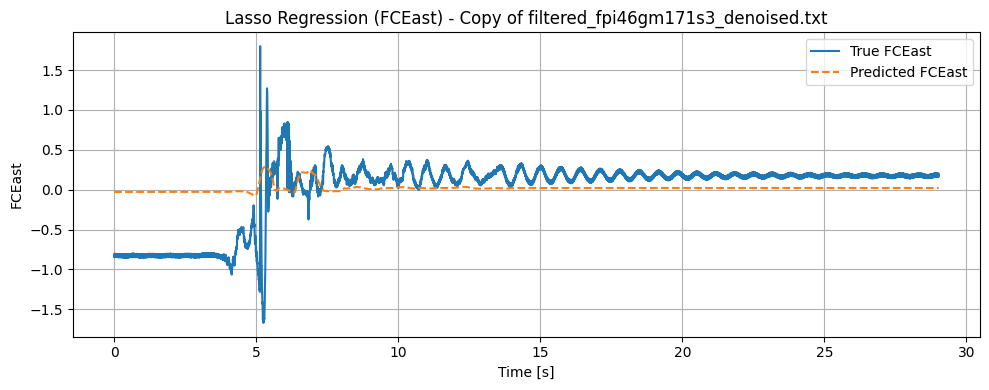

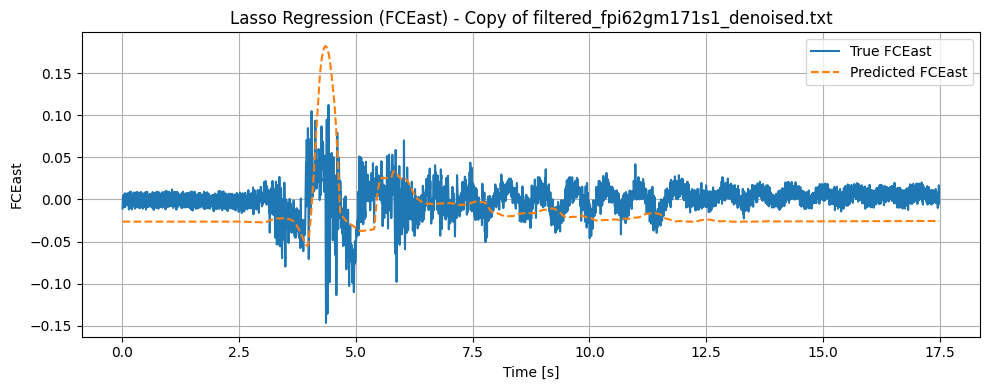

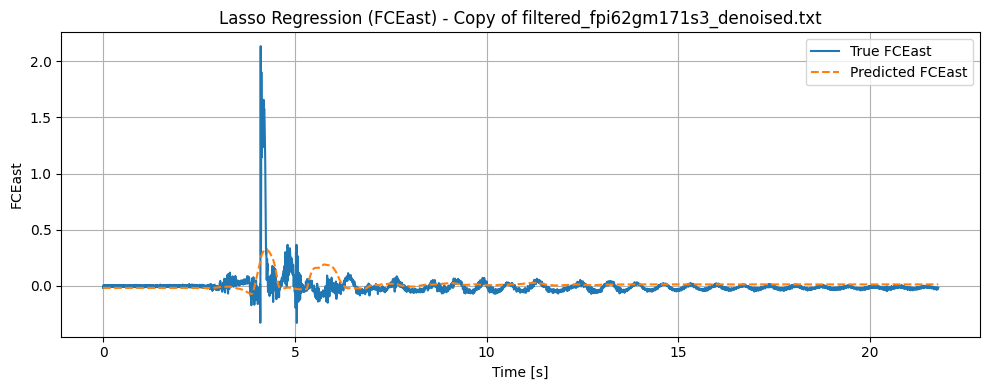

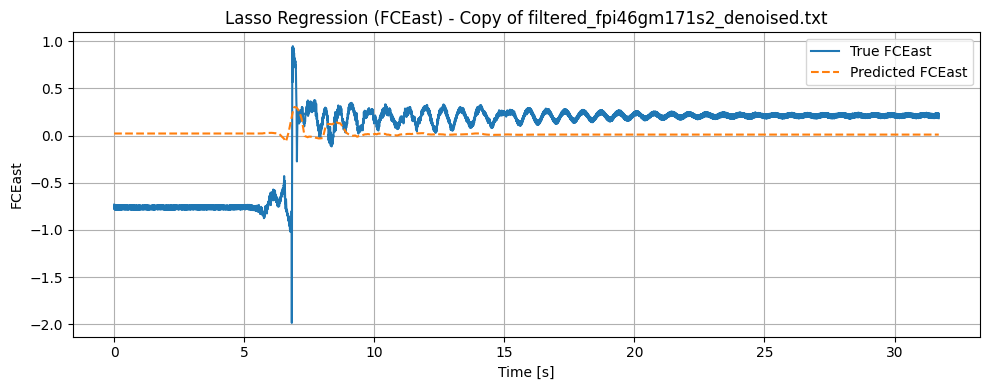

 Lasso Regression (FCWest):
   MSE : 1.1937
   R²  : 0.1968



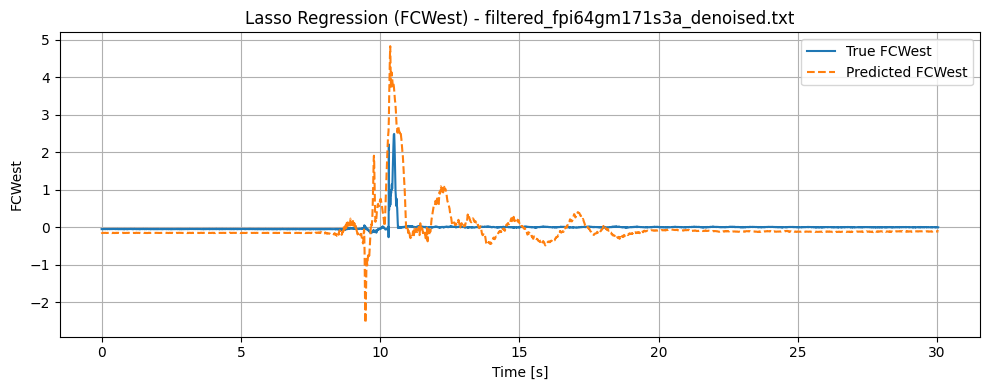

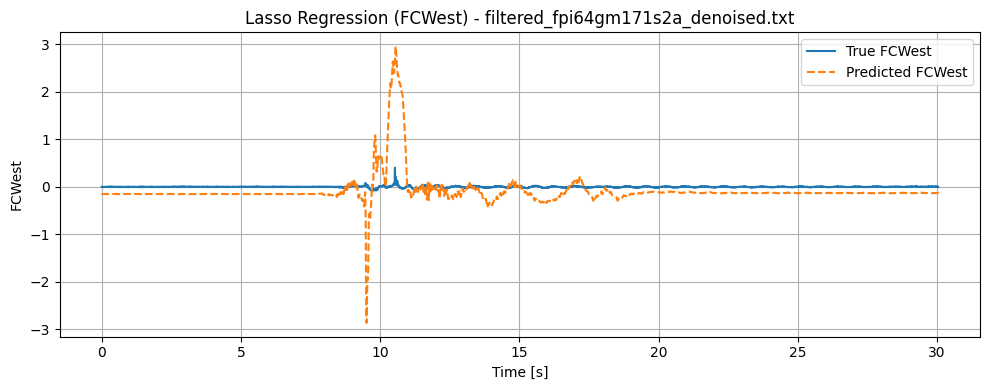

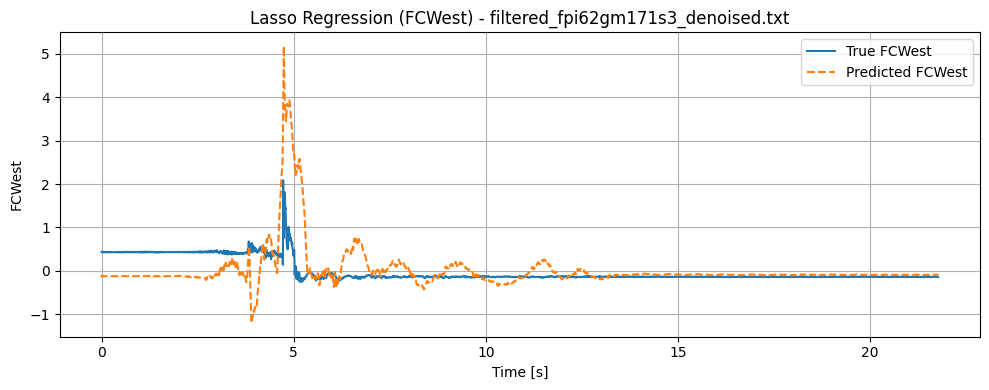

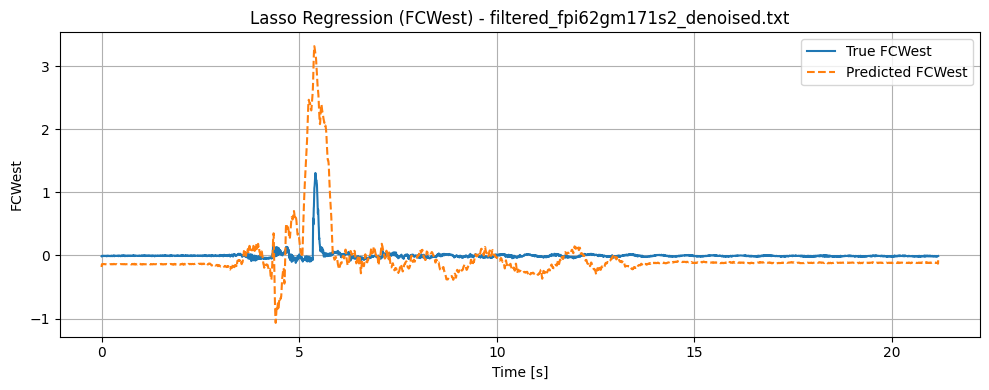

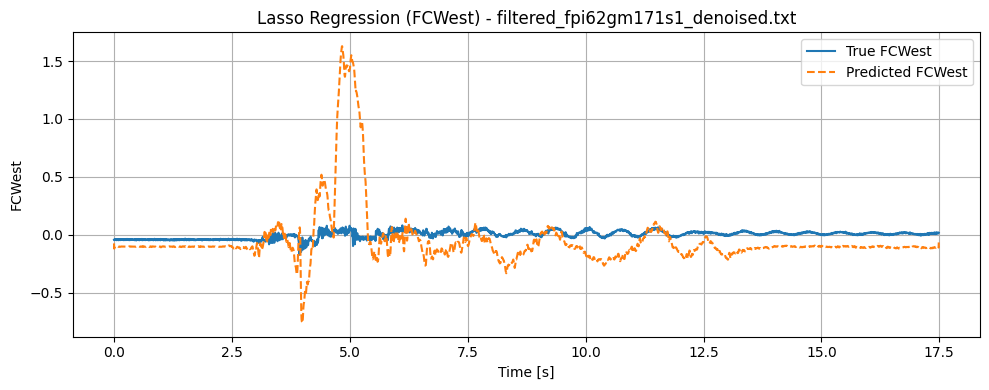

...

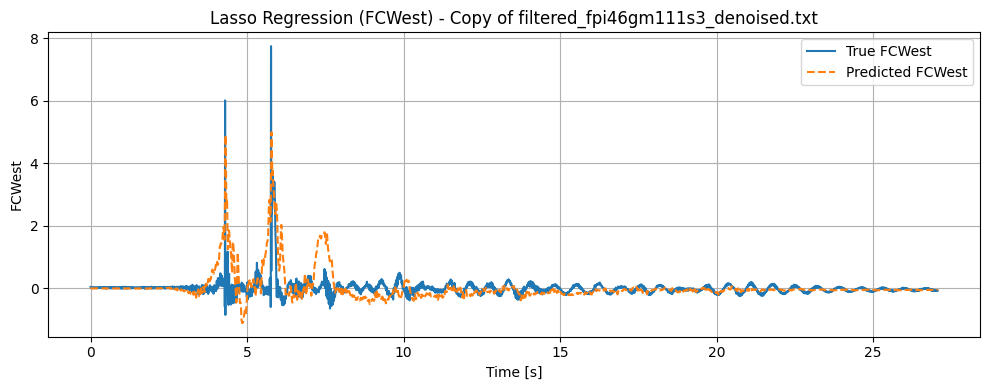

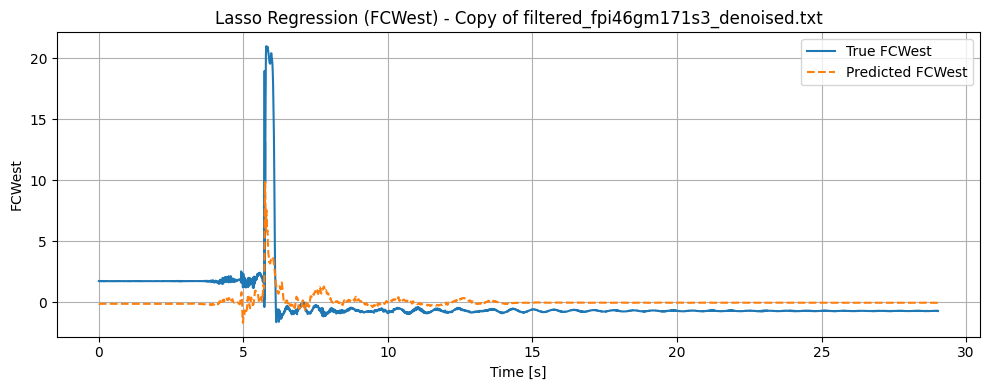

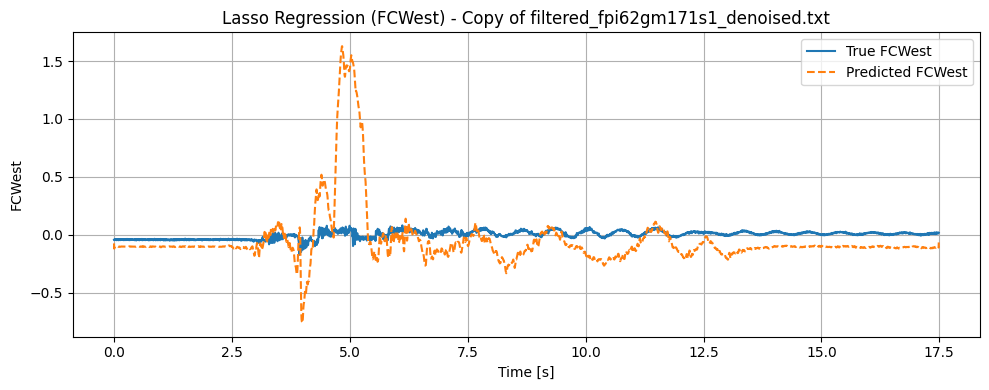

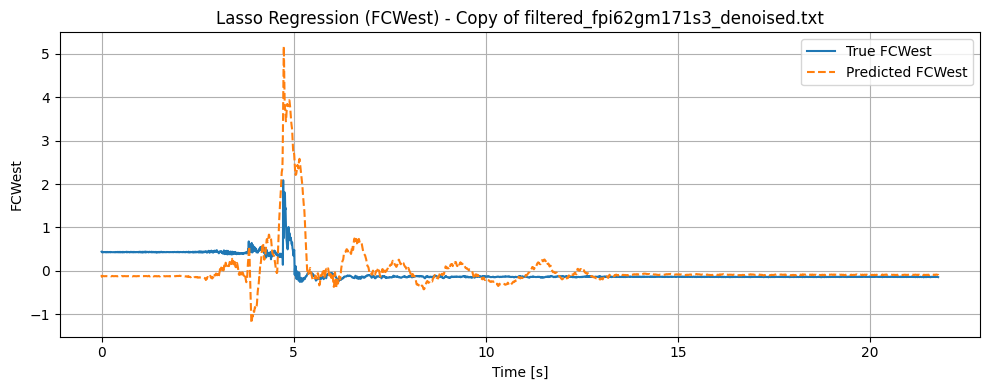

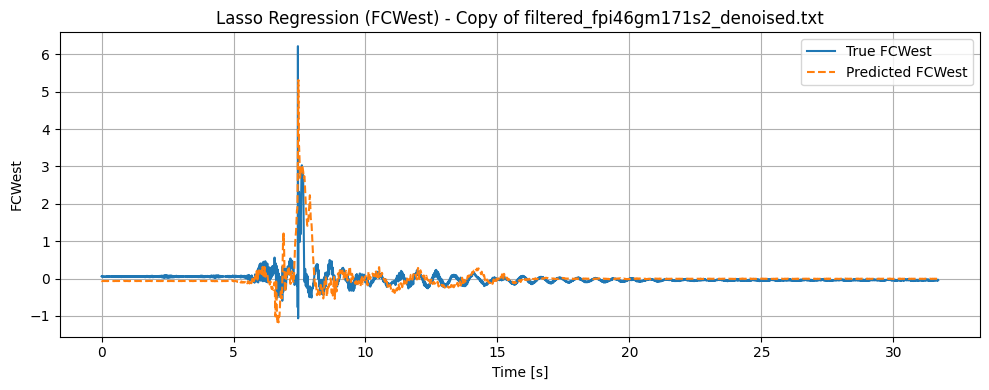

In [13]:
# 3. Lasso Regression

# FCEast
lasso_model_east = Lasso(alpha=0.01)
lasso_model_east.fit(X_train_east, y_train_east)

y_test_pred_east = lasso_model_east.predict(X_test_east)
print(" Lasso Regression (FCEast):")
print(f"   MSE : {mean_squared_error(y_test_east, y_test_pred_east):.4f}")
print(f"   R²  : {r2_score(y_test_east, y_test_pred_east):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_east]
        y_true = df[target_column_east].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_east.transform(X_file)
        y_pred = lasso_model_east.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCEast', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCEast', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Lasso Regression (FCEast) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCEast")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCEast for {file_name}: {e}")

# FCWest
lasso_model_west = Lasso(alpha=0.01)
lasso_model_west.fit(X_train_west, y_train_west)

y_test_pred_west = lasso_model_west.predict(X_test_west)
print(" Lasso Regression (FCWest):")
print(f"   MSE : {mean_squared_error(y_test_west, y_test_pred_west):.4f}")
print(f"   R²  : {r2_score(y_test_west, y_test_pred_west):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_west]
        y_true = df[target_column_west].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_west.transform(X_file)
        y_pred = lasso_model_west.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCWest', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCWest', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Lasso Regression (FCWest) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCWest")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCWest for {file_name}: {e}")


 Polynomial Regression (FCEast, deg=2):
   MSE : 0.0604
   R²  : 0.2904



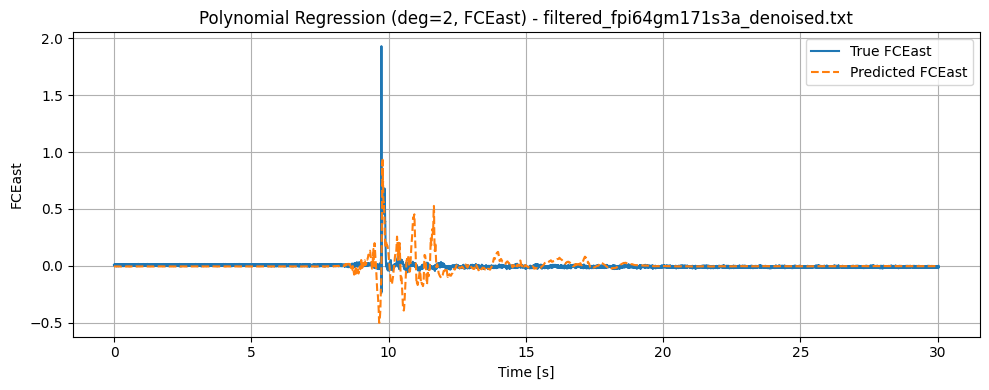

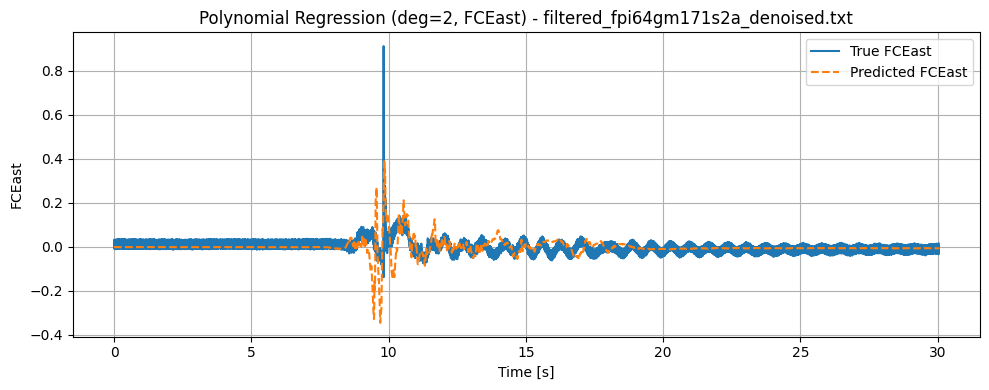

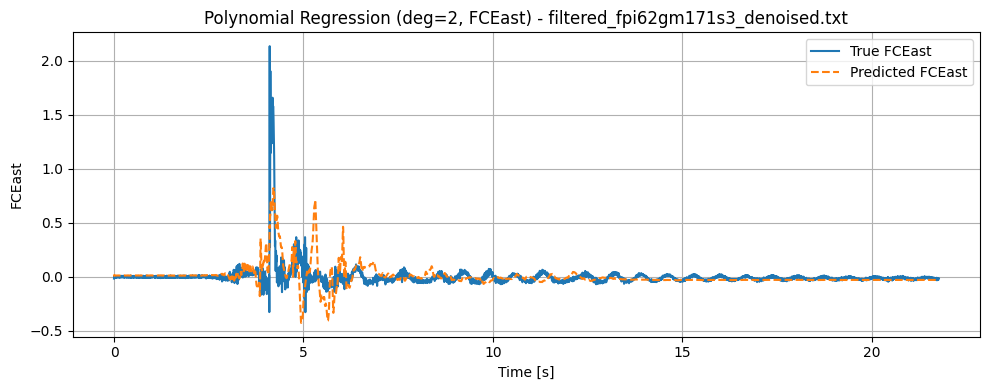

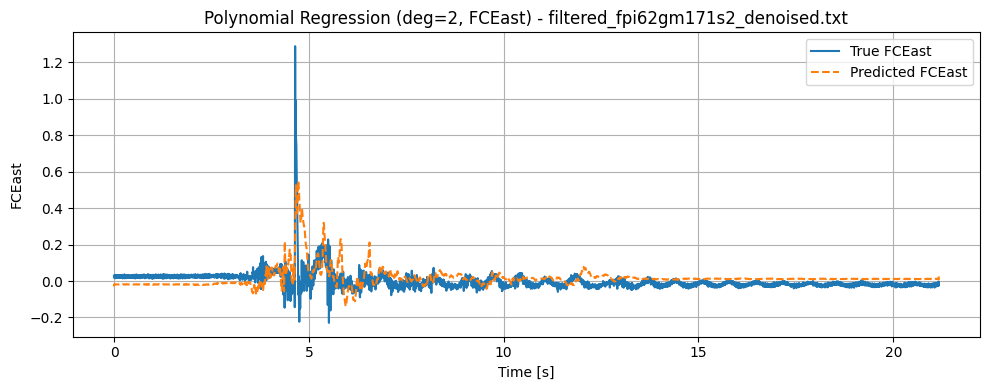

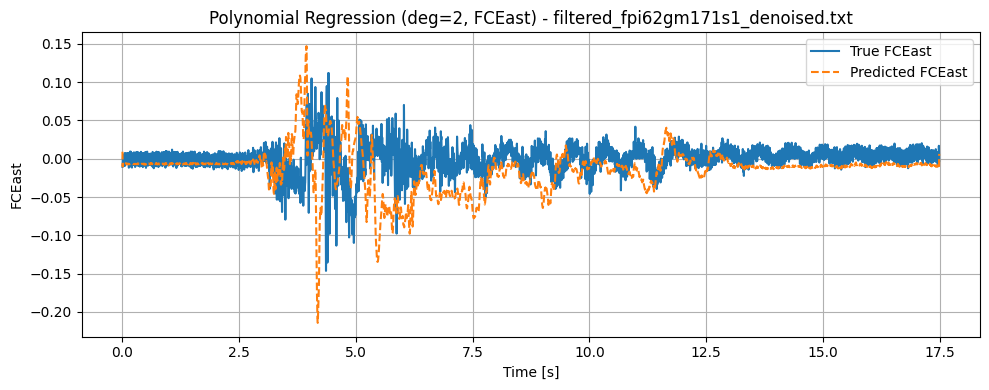

...

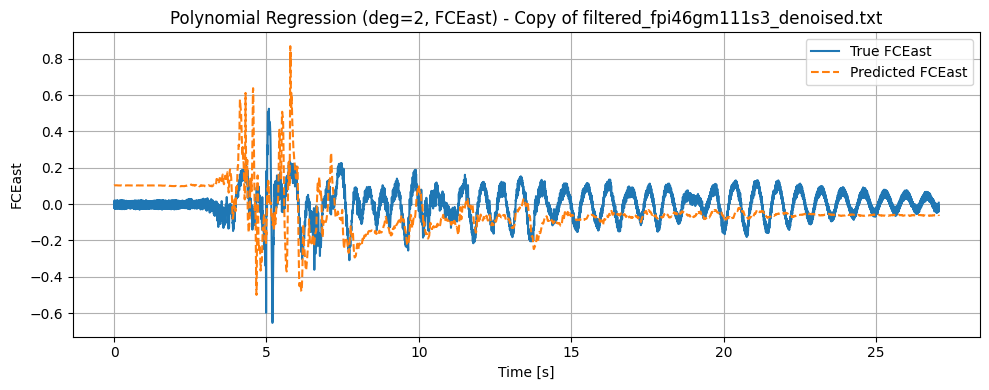

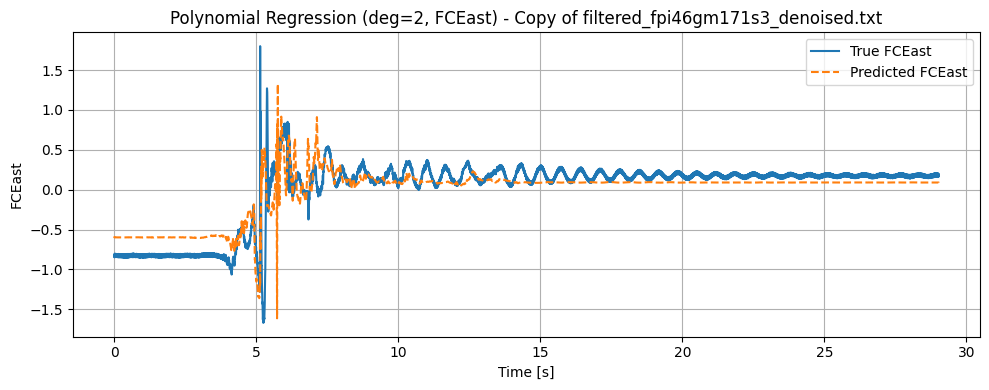

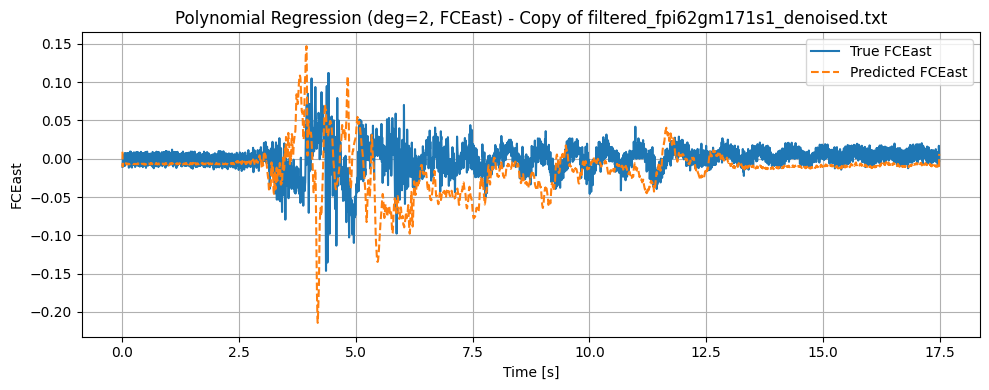

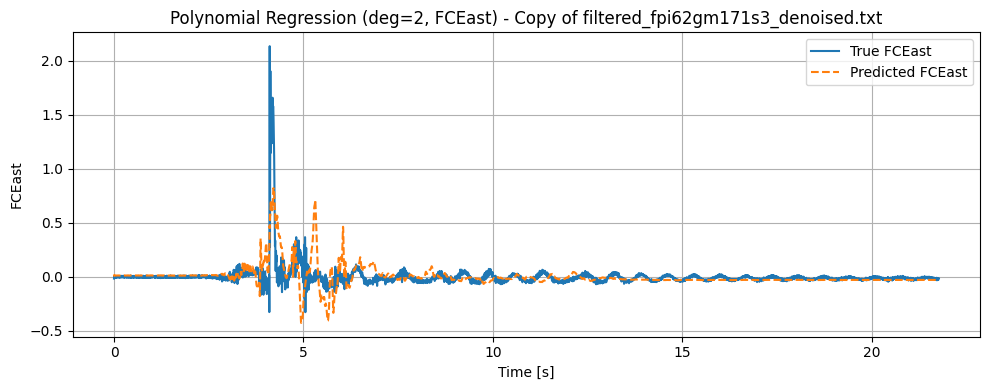

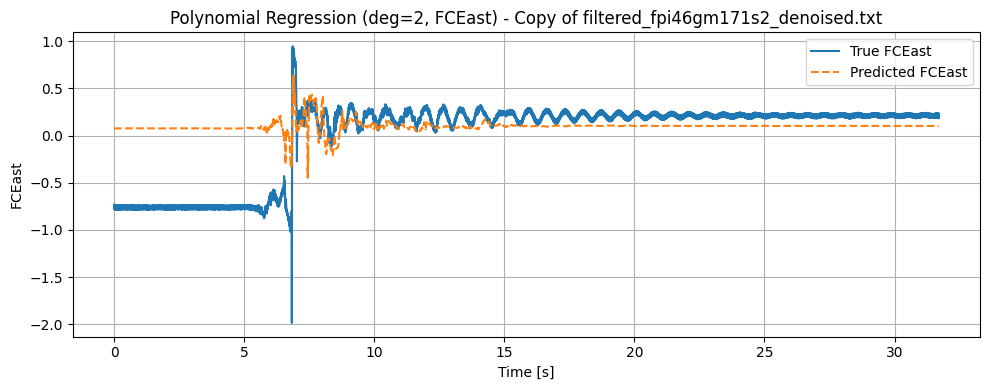

 Polynomial Regression (FCWest, deg=2):
   MSE : 0.4608
   R²  : 0.6899



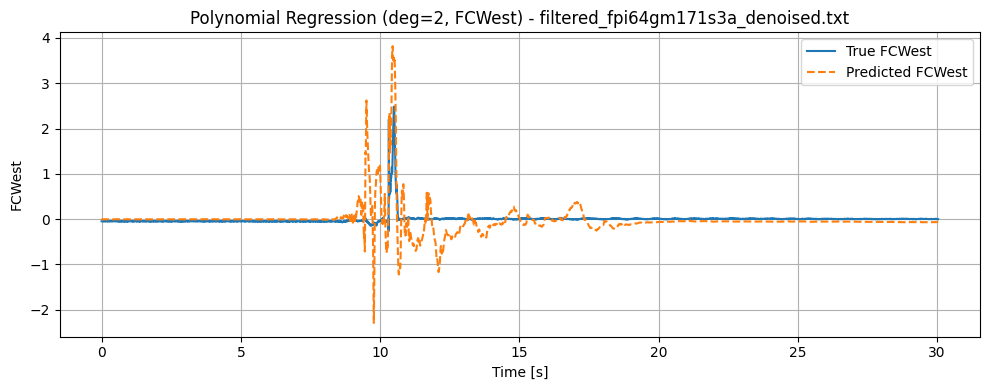

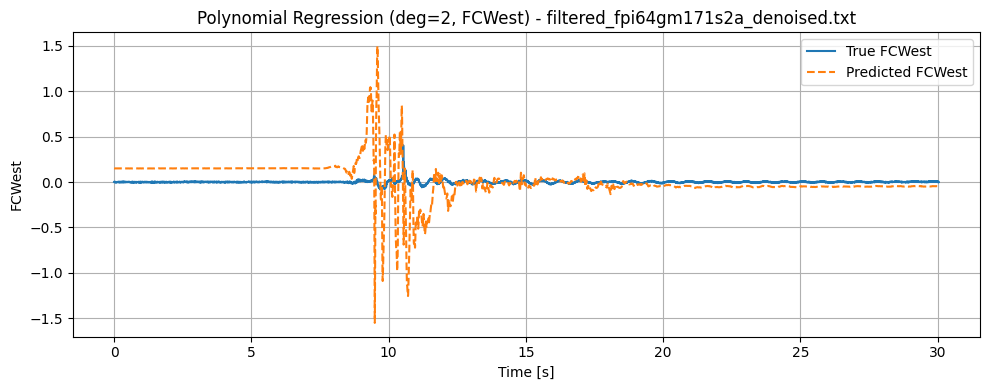

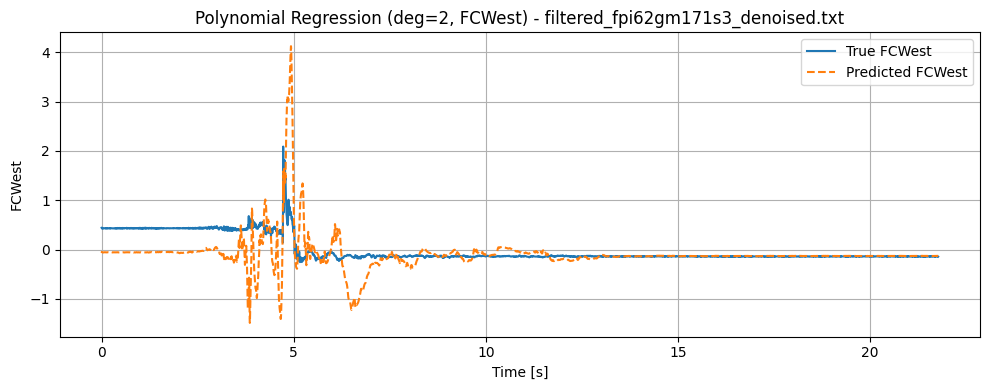

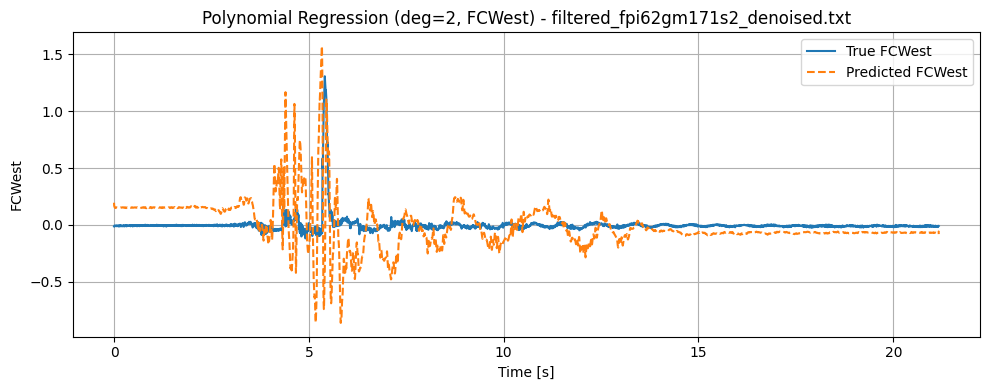

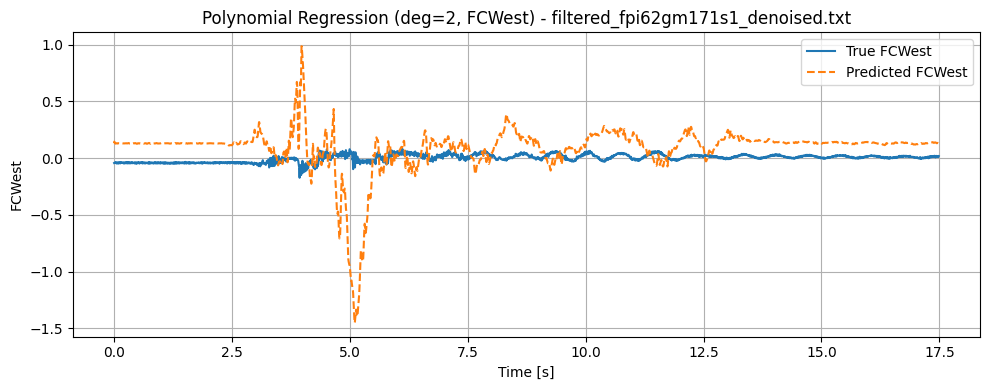

...

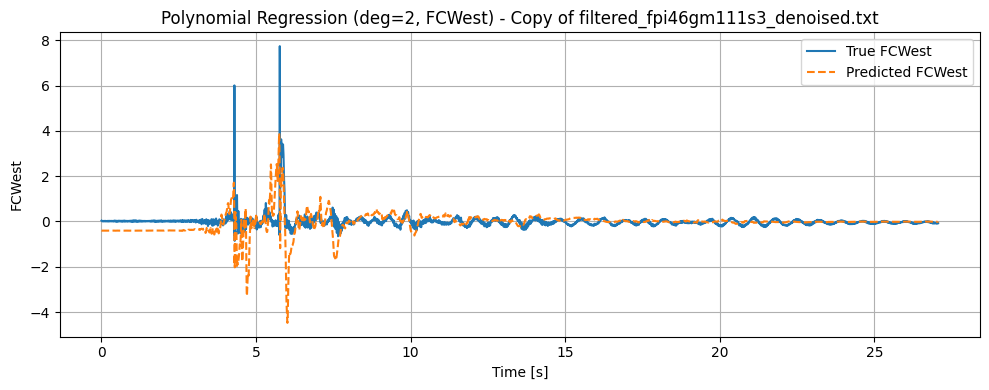

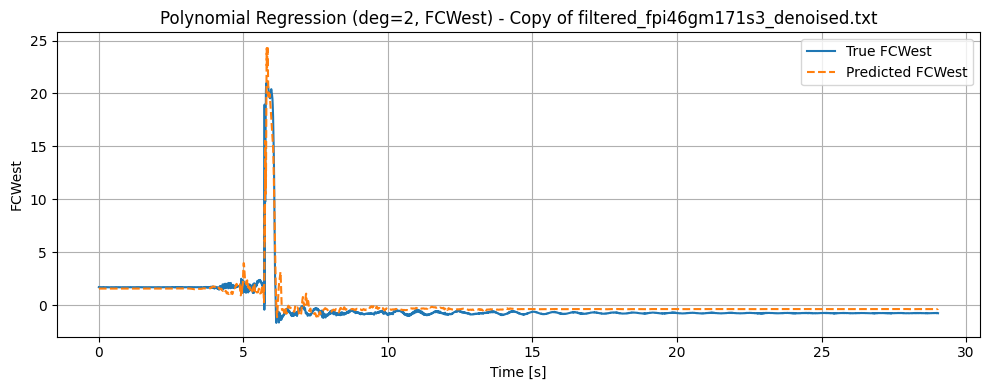

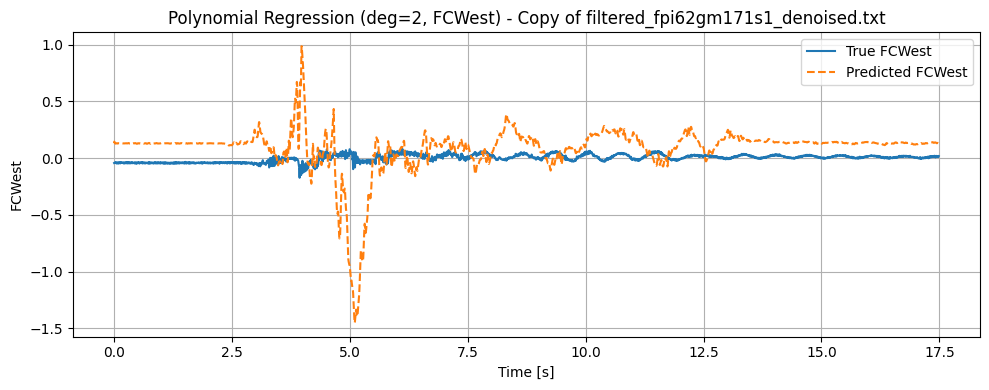

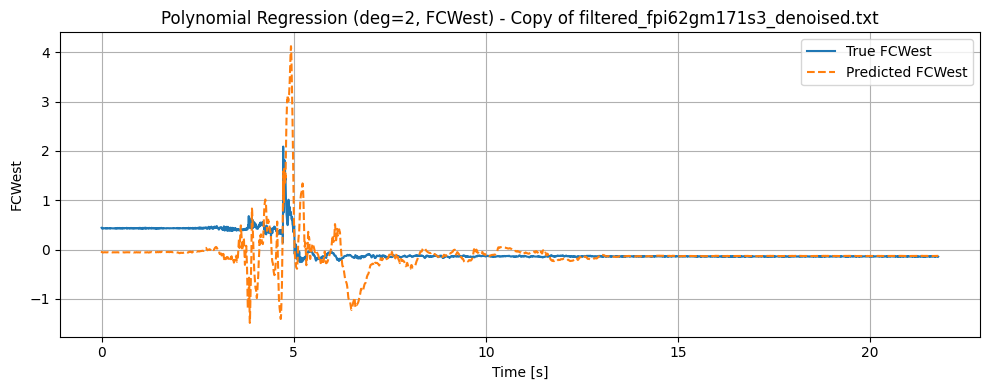

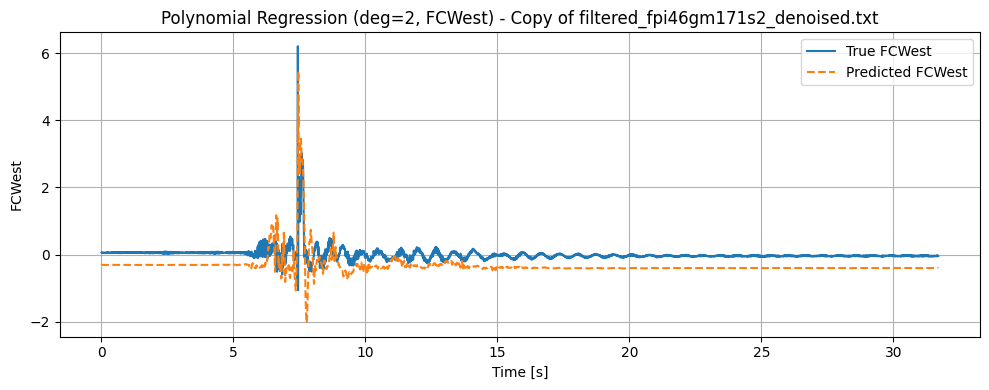

In [14]:
#  4. Polynomial Regression

#  FCEast
poly_model_east = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
poly_model_east.fit(X_train_east, y_train_east)

y_test_pred_east = poly_model_east.predict(X_test_east)
print(" Polynomial Regression (FCEast, deg=2):")
print(f"   MSE : {mean_squared_error(y_test_east, y_test_pred_east):.4f}")
print(f"   R²  : {r2_score(y_test_east, y_test_pred_east):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_east]
        y_true = df[target_column_east].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_east.transform(X_file)
        y_pred = poly_model_east.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCEast', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCEast', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Polynomial Regression (deg=2, FCEast) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCEast")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCEast for {file_name}: {e}")

#  FCWest
poly_model_west = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
poly_model_west.fit(X_train_west, y_train_west)

y_test_pred_west = poly_model_west.predict(X_test_west)
print(" Polynomial Regression (FCWest, deg=2):")
print(f"   MSE : {mean_squared_error(y_test_west, y_test_pred_west):.4f}")
print(f"   R²  : {r2_score(y_test_west, y_test_pred_west):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_west]
        y_true = df[target_column_west].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_west.transform(X_file)
        y_pred = poly_model_west.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCWest', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred, label='Predicted FCWest', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Polynomial Regression (deg=2, FCWest) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCWest")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCWest for {file_name}: {e}")


In [ ]:
# 5. Random Forest Regression

# FCEast
rf_model_east = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_east.fit(X_train_east, y_train_east)

y_test_pred_east = rf_model_east.predict(X_test_east)
print(" Random Forest Regression (FCEast):")
print(f"   MSE : {mean_squared_error(y_test_east, y_test_pred_east):.4f}")
print(f"   R²  : {r2_score(y_test_east, y_test_pred_east):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_east]
        y_true = df[target_column_east].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_east.transform(X_file)
        y_pred_rf = rf_model_east.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCEast', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred_rf, label='Predicted FCEast', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Random Forest Regression (FCEast) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCEast")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCEast for {file_name}: {e}")


In [ ]:
# FCWest
rf_model_west = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_west.fit(X_train_west, y_train_west)

y_test_pred_west = rf_model_west.predict(X_test_west)
print(" Random Forest Regression (FCWest):")
print(f"   MSE : {mean_squared_error(y_test_west, y_test_pred_west):.4f}")
print(f"   R²  : {r2_score(y_test_west, y_test_pred_west):.4f}\n")

for df, file_name in all_data:
    try:
        X_file = df[base_predictors_west]
        y_true = df[target_column_west].values
        time_vals = df[time_column].values
        X_file_scaled = scaler_west.transform(X_file)
        y_pred_rf = rf_model_west.predict(X_file_scaled)

        if plot_fc:
            plt.figure(figsize=(10, 4))
            plt.plot(time_vals, y_true, label='True FCWest', color='tab:blue', linewidth=1.5)
            plt.plot(time_vals, y_pred_rf, label='Predicted FCWest', linestyle='--', color='tab:orange', linewidth=1.5)
            plt.title(f"Random Forest Regression (FCWest) - {file_name}")
            plt.xlabel("Time [s]")
            plt.ylabel("FCWest")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f" Error processing FCWest for {file_name}: {e}")


In [ ]:
# Final Combined Comparison Plots

# Predict on test set
y_pred_lr = lr_model.predict(X_test)
y_pred_ridge = ridge_model.predict(X_test)
y_pred_lasso = lasso_model.predict(X_test)
y_pred_poly = poly_model.predict(X_test)
y_pred_rf = rf_model.predict(X_test)

# Plot: True vs Predicted FC (First 100 Samples)
plt.figure(figsize=(12, 5))
plt.plot(y_test.values[:100], label='True FC', linewidth=2)
plt.plot(y_pred_lr[:100], label='Linear', linestyle='--')
plt.plot(y_pred_ridge[:100], label='Ridge', linestyle='--')
plt.plot(y_pred_lasso[:100], label='Lasso', linestyle='--')
plt.plot(y_pred_poly[:100], label='Polynomial (deg=2)', linestyle='--')
plt.plot(y_pred_rf[:100], label='Random Forest', linestyle='--')
plt.title("True vs Predicted FC (First 100 Samples)")
plt.xlabel("Sample Index")
plt.ylabel("FC")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# MSE and R² values
model_names = ['Linear', 'Ridge', 'Lasso', 'Poly (deg=2)', 'Random Forest']
mses = [
    mean_squared_error(y_test, y_pred_lr),
    mean_squared_error(y_test, y_pred_ridge),
    mean_squared_error(y_test, y_pred_lasso),
    mean_squared_error(y_test, y_pred_poly),
    mean_squared_error(y_test, y_pred_rf)
]
r2s = [
    r2_score(y_test, y_pred_lr),
    r2_score(y_test, y_pred_ridge),
    r2_score(y_test, y_pred_lasso),
    r2_score(y_test, y_pred_poly),
    r2_score(y_test, y_pred_rf)
]

# Bar Plot: MSE Comparison
plt.figure(figsize=(8, 4))
plt.bar(model_names, mses, color='skyblue')
plt.title("Mean Squared Error (MSE) Comparison")
plt.ylabel("MSE")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Bar Plot: R² Score Comparison
plt.figure(figsize=(8, 4))
plt.bar(model_names, r2s, color='lightgreen')
plt.title("R² Score Comparison")
plt.ylabel("R²")
plt.ylim(0, 1)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
